# Spatial Transcriptomic Analysis of the Tumor Microenvironment via a Grid-Level Z-axis Stratification and Molecular Density
# 基于网格级 Z 轴分层与分子密度的肿瘤微环境空间转录组分析

## Executive Summary
## 概述
Single-molecule spatial transcriptomics platforms (e.g., 10x Genomics Xenium) report RNA molecules with subcellular spatial coordinates. In many workflows, tissue organization is summarized using 2D transcript density and/or cell segmentation. In densely packed tumor regions, segmentation performance can be sensitive to morphological variability and imaging conditions. In addition, absolute Z coordinates can be influenced by slide-scale acquisition geometry (e.g., tissue mounting tilt), which complicates global 3D interpretation.

单分子空间转录组平台（如 10x Genomics Xenium）能够以亚细胞尺度报告 RNA 分子的空间坐标信息。许多分析流程主要依赖 2D 转录本密度和/或细胞分割来概括组织结构。在肿瘤组织高度致密的区域，细胞分割结果可能对形态差异与成像条件较为敏感。此外，绝对 Z 坐标可能受到玻片尺度采集几何因素（如贴附倾斜）的影响，从而增加全局 3D 解读的难度。

In this notebook, we implement a grid-based, segmentation-free framework to relate coordinate-derived geometric summaries to molecular readouts in an FFPE breast cancer Xenium dataset. We partition the tissue into fixed-size spatial grids and compute (i) transcript count per grid (log-transformed) as a density proxy and (ii) the Z-Stacking Index, defined as the within-grid standard deviation of transcript Z coordinates, as a local Z-dispersion metric. These features are then used for unsupervised spatial stratification, followed by grid-level differential expression and exploratory enrichment analyses to characterize group-associated transcriptional programs.

在本 Notebook 中，我们实现了一套基于空间网格、无需细胞分割的分析框架，用于在 FFPE 乳腺癌 Xenium 数据中将“由坐标直接计算得到的几何摘要”与“分子读出”联系起来。我们将组织区域划分为固定尺寸的空间网格，并计算两类网格级特征：（i）每网格转录本计数（对数变换）作为密度代理指标；（ii）Z-Stacking Index（Z 轴堆叠指数），定义为网格内转录本 Z 坐标的标准差，作为局部 Z 离散指标。随后以这些特征进行无监督空间分层，并通过网格级差异表达与探索性富集分析描述与不同组相关的转录程序。

## Workflow and Key Outputs
## 工作流与关键输出
This notebook documents a stepwise analysis from quality control to interface-focused profiling:
1. QC and global Z diagnostics: filter low-quality and technical-control transcripts; summarize global Z-coordinate patterns to motivate localized Z summaries.
2. Grid aggregation and geometric features: compute grid-level density proxy and Z-Stacking Index to describe local 3D dispersion with reduced reliance on absolute Z depth.
3. Unsupervised stratification and molecular characterization: cluster grids using geometric features only, then compare groups using grid-level DGE, marker-group scoring, and exploratory pathway enrichment.
4. Interface-centric analysis: define an operational boundary between major spatial groups, compute signed distance, and profile distance-binned gradients; quantify neighborhood density and mixing as correlates of Z dispersion.

本 Notebook 记录了从质量控制到界面聚焦分析的分步流程：
1. QC 与全局 Z 诊断：过滤低质量与技术对照转录本；汇总全局 Z 坐标模式以引出局部 Z 指标的必要性。
2. 网格聚合与几何特征：计算网格级密度代理指标与 Z-Stacking Index，用于描述局部 3D 离散程度，并降低对绝对 Z 深度的依赖。
3. 无监督分层与分子刻画：仅使用几何特征对网格进行聚类；随后通过网格级 DGE、标记组得分与探索性通路富集对不同组进行分子层面描述。
4. 界面中心化分析：在主要空间组之间定义操作性边界并计算有符号距离；对距离分箱后的特征梯度进行剖析；量化邻域密度与邻域混合度作为 Z 离散度的相关背景指标。

Overall, the notebook provides a segmentation-free workflow for spatial stratification that integrates coordinate-derived geometric summaries with gene-level and pathway-level readouts. The outputs are designed to support hypothesis generation about boundary-associated transcriptional programs while keeping interpretation anchored to grid-level statistics and explicit analysis settings.

总体而言，本 Notebook 提供了一套分割无关的空间分层流程，将由坐标计算得到的几何摘要与基因层面和通路层面的读出相结合。相关输出旨在支持对“边界相关转录程序”的假设生成，并将解释限定在网格级统计与明确的分析设置之内。

# Part 1: Data Initialization and Quality Control
# 第一部分：数据初始化与质量控制

## 1. Introduction and Dataset Description
## 1. 引言与数据集描述
This section defines the computational environment and runs an initial quality control (QC) workflow for a single-molecule spatial transcriptomics dataset. We use a publicly available 10x Genomics Xenium dataset generated from a Formalin-Fixed Paraffin-Embedded (FFPE) human breast cancer tissue section. The dataset contains on the order of 4.26 × 10^7 transcript localizations. To support scalable I/O and memory-aware processing, we use the `polars` library and its lazy execution model for data loading and filtering.

本节建立计算环境，并对单分子空间转录组数据集执行初步质量控制（QC）流程。本研究使用公开的 10x Genomics Xenium 数据集，样本来源于福尔马林固定石蜡包埋（FFPE）的人类乳腺癌组织切片。该数据集包含约 4.26 × 10^7 个转录本空间定位点。为支持可扩展的 I/O 与更可控的内存开销，我们采用 `polars` 及其惰性执行模式进行数据读取与过滤。

## 2. Quality Control Criteria
## 2. 质量控制标准
To improve the interpretability and stability of downstream spatial analyses, we apply transcript-level filters based on two criteria:
1. Phred-like quality value (QV): transcripts with QV < 20.0 are removed. Under the standard Phred interpretation, QV = 20 corresponds to an estimated error probability of 1% (approximately 99% base-calling accuracy).
2. Technical control exclusion: records corresponding to technical controls or unmapped targets are removed, including probes with feature names prefixed by `NegControl`, `Unassigned`, or `BLANK`.

为提高下游空间分析的可解释性与稳定性，我们在单转录本层面基于以下两类标准进行过滤：
1. Phred 类质量值（QV）：移除 QV < 20.0 的转录本。在常用的 Phred 解释下，QV = 20 对应约 1% 的错误概率（约 99% 的碱基识别准确率）。
2. 技术对照排除：移除技术对照或未映射目标对应的记录，包括 `feature_name` 以 `NegControl`、`Unassigned` 或 `BLANK` 为前缀的探针。

In [25]:
# ===========================================================================
# Part 1: Data Initialization and Quality Control (QC)
# ===========================================================================

# Standard library imports
import os
import warnings

# Third-party library imports
import polars as pl

# Ignore warnings for this notebook session.
warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# 1.1 Quality Control (QC) Parameters
# ---------------------------------------------------------------------------
# Transcript-level Phred-like quality value threshold (QV).
# QV=20 corresponds to an estimated error probability of 1%.
QV_THRESHOLD = 20.0

# ---------------------------------------------------------------------------
# 1.2 Spatial Grid Parameters
# ---------------------------------------------------------------------------
# Grid resolution in micrometers (um).
BIN_SIZE_UM = 20.0

# Quantile cutoffs reserved for later exploratory/downstream analyses.
DENSITY_QUANTILE_EXPLORE = 0.10
Z_STD_HIGH_QUANTILE_EXPLORE = 0.50
Z_STD_LOW_QUANTILE_EXPLORE = 0.50

DENSITY_QUANTILE_DOWNSTREAM = 0.10
Z_STD_HIGH_QUANTILE_DOWNSTREAM = 0.50
Z_STD_LOW_QUANTILE_DOWNSTREAM = 0.50

# ---------------------------------------------------------------------------
# 1.3 File Input/Output Paths
# ---------------------------------------------------------------------------
INPUT_DIR = "input"
OUTPUT_DIR = "."

MARKER_CSV = os.path.join(
    INPUT_DIR, "Xenium_FFPE_Human_Breast_Cancer_Rep1_gene_groups.csv"
)
TRANSCRIPTS_PARQUET = os.path.join(INPUT_DIR, "outs", "transcripts.parquet")

HE_IMAGE_PATTERNS = [
    os.path.join(INPUT_DIR, "*_he_image.ome.tif"),
    os.path.join(INPUT_DIR, "*_he_image.tif"),
]

FIGURE_1C_PATH = os.path.join(OUTPUT_DIR, "Figure_1C_Global_Overview.png")
FIGURE_3B_EFFECT_SIZE_PATH = os.path.join(OUTPUT_DIR, "Figure_3B_Effect_Size_Overview.png")
FIGURE_6A_SENSITIVITY_HEATMAP_PATH = os.path.join(OUTPUT_DIR, "Figure6A_Sensitivity_Heatmap.png")
FIGURE_6B_SENSITIVITY_LINES_PATH = os.path.join(OUTPUT_DIR, "Figure6B_Sensitivity_Lines.png")
FIGURE_6_DGE_COMBINED_PATH = os.path.join(OUTPUT_DIR, "Figure6_DGE_Combined.png")
FIGURE_7_PATHWAY_ENRICHMENT_PATH = os.path.join(OUTPUT_DIR, "Figure7_Pathway_Enrichment.png")
FIGURE_8_ENDOTHELIAL_PATH = os.path.join(OUTPUT_DIR, "Figure8_Endothelial_Distribution.png")
FIGURE_9_DISTANCE_GRADIENT_PATH = os.path.join(OUTPUT_DIR, "Figure9_Distance_Gradient.png")

# ---------------------------------------------------------------------------
# 1.4 Data Loading (Lazy)
# ---------------------------------------------------------------------------
lazy_df = pl.scan_parquet(TRANSCRIPTS_PARQUET)

# Dataset-level consistency check (hard-coded for this notebook version).
# If the input is a subset or a different release, update this value accordingly.
EXPECTED_RAW_TRANSCRIPT_COUNT = 42_638_083

# ---------------------------------------------------------------------------
# 1.5 Data Cleaning and Filtering
# ---------------------------------------------------------------------------
# Raw count from the current input source.
raw_transcript_count = lazy_df.select(pl.len().alias("n")).collect().item()

clean_plan = (
    lazy_df
    .with_columns(pl.col("feature_name").cast(pl.String))
    .filter(pl.col("qv") >= QV_THRESHOLD)
    # Remove technical controls and unmapped features.
    .filter(
        ~pl.col("feature_name").str.starts_with("NegControl")
        & ~pl.col("feature_name").str.starts_with("Unassigned")
        & ~pl.col("feature_name").str.starts_with("BLANK")
    )
)

# ---------------------------------------------------------------------------
# 1.6 Execute and Report
# ---------------------------------------------------------------------------
df = clean_plan.collect()

print("=" * 55)
print("Xenium Spatial Transcriptomics QC Pipeline Summary")
print("=" * 55)
print(f"Expected Raw Transcript Count: {EXPECTED_RAW_TRANSCRIPT_COUNT:,}")
print(f"Post-QC Transcript Count     : {df.height:,}")
print(f"Retained Feature Columns     : {df.width}")
print("=" * 55)

Xenium Spatial Transcriptomics QC Pipeline Summary
Expected Raw Transcript Count: 42,638,083
Post-QC Transcript Count     : 34,472,294
Retained Feature Columns     : 8


# Part 2: 3D Spatial Architecture and Z-axis Distribution Profiling
# 第二部分：3D 空间架构与 Z 轴分布轮廓分析

## 1. Z-axis Transcript Distribution
## 1. Z 轴转录本分布
Advanced spatial transcriptomics platforms (e.g., 10x Genomics Xenium) report RNA molecules in a three-dimensional coordinate system. Summarizing the distribution of transcript Z coordinates provides a dataset-level view of the sampled depth range and can help interpret subsequent spatial analyses. In Figure 1A, transcripts span a Z range of 3.68–49.23 µm. The histogram has a dominant mode centered at 16.66 µm (maximum bin count > 850,000 under the current binning) and shows a bimodal pattern. Relative to the commonly stated nominal thickness of FFPE sections (e.g., ~5 µm), this broad Z span indicates that absolute Z coordinates should be interpreted with caution and may reflect factors beyond the nominal section thickness.

诸如 10x Genomics Xenium 等空间转录组平台可在三维坐标系中报告 RNA 分子的空间位置。对转录本 Z 坐标进行分布汇总，可以从数据集层面概览采样深度范围，并为后续空间分析提供解释背景。如图 1A 所示，转录本的 Z 范围为 3.68–49.23 µm。该直方图在 16.66 µm 处具有主要峰（在当前分箱设置下，最高区间计数 > 850,000），并呈现双峰结构。相较于 FFPE 切片通常标称的厚度（例如约 5 µm），如此宽的 Z 跨度提示需要谨慎解释绝对 Z 坐标；该现象可能不仅由切片标称厚度决定。

## 2. X–Z Projection and Macroscopic Z Gradients
## 2. X–Z 投影与宏观 Z 梯度
To examine large-scale Z-coordinate structure, we generated an X–Z projection using a 1% random subsample of transcripts (Figure 1B). The scatter plot shows a systematic Z gradient across the X-axis, with the baseline Z level increasing from approximately 10 µm to approximately 40 µm over an X span of ~7.5 mm. This pattern is consistent with a macroscopic tilt between the tissue section and the imaging reference plane. Under such conditions, global Z histograms can reflect a combination of biological structure and acquisition-related geometry, and should not be interpreted as a direct measure of tissue thickness.

为检查大尺度的 Z 坐标结构，我们对转录本进行 1% 随机降采样并绘制 X–Z 投影（图 1B）。散点图显示沿 X 轴存在系统性的 Z 梯度：在约 7.5 mm 的 X 跨度上，Z 的基线水平由约 10 µm 上升至约 40 µm。该模式与组织切片相对于成像参考平面存在宏观倾斜的情况一致。在这种情况下，全局 Z 直方图可能同时反映生物学结构与采集几何因素，因此不宜将其直接解释为组织厚度的量度。

## 3. Morphological Confounding and Motivation for Local Z Metrics
## 3. 形态学混杂与局部 Z 指标的动机
The global Z histogram aggregates all transcripts across the tissue and is therefore influenced by where transcripts are concentrated in the X–Y plane. Regions with higher transcript yield (e.g., due to higher cellularity or larger sampled area) contribute more strongly to the overall Z distribution. If such regions are spatially associated with different baseline Z levels under a macroscopic Z gradient, the marginal Z histogram can show multiple modes. This provides a practical motivation to focus on localized, relative Z summaries rather than absolute Z depth when the goal is to quantify local 3D dispersion.

Based on this consideration, we introduce a grid-aggregation strategy in subsequent sections. By partitioning the tissue into fixed spatial grids and summarizing the within-grid dispersion of Z coordinates (the Z-Stacking Index, defined as the standard deviation of Z within each grid), we aim to capture local Z-axis variability while reducing sensitivity to large-scale Z shifts.

全局 Z 直方图对全组织内所有转录本进行汇总，因此会受到转录本在 X–Y 平面上分布不均的影响。转录本产出更高的区域（例如由于细胞密度更高或有效采样面积更大）会对整体 Z 分布产生更强的贡献。如果在存在宏观 Z 梯度的情况下，这些高产出区域与不同的 Z 基线水平相对应，那么边缘化后的 Z 直方图可能出现多个峰。这提示：当分析目标是量化局部 3D 离散程度时，应优先考虑局部的、相对的 Z 摘要指标，而不是直接依赖绝对 Z 深度。

基于这一考虑，我们在后续章节引入空间网格聚合策略。通过将组织划分为固定尺寸的空间网格，并对每个网格内 Z 坐标的离散程度进行汇总（Z-Stacking Index，定义为网格内 Z 坐标的标准差），我们旨在表征局部 Z 轴变异，同时降低对大尺度 Z 漂移的敏感性。

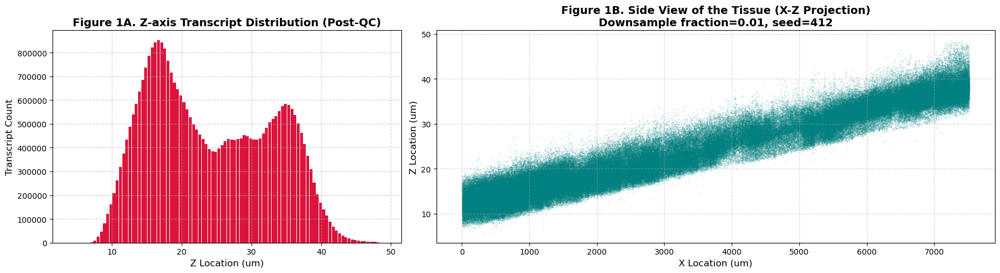

3D Spatial Architecture: Z-axis Profiling Summary
Z-axis Spatial Range       : 3.68 ~ 49.23 um
Peak Histogram Center (Z)  : 16.66 um
Max Transcripts per Z Bin  : 850,924
Histogram Bins             : 100


In [26]:
# ===========================================================================
# Part 2: 3D Spatial Architecture and Z-axis Distribution Profiling
# ===========================================================================

import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------------------------------------
# 2.1 Z-axis extraction and histogram aggregation
# ---------------------------------------------------------------------------
# Use post-QC transcripts (df) to summarize the distribution of Z coordinates.
z_um = df["z_location"]
z_min_um = float(z_um.min())
z_max_um = float(z_um.max())

# Equal-width histogram across the observed Z range.
n_z_bins = 100
z_edges = np.linspace(z_min_um, z_max_um, n_z_bins + 1)
z_counts, _ = np.histogram(z_um.to_numpy(), bins=z_edges)
z_centers = (z_edges[:-1] + z_edges[1:]) / 2

# ---------------------------------------------------------------------------
# 2.2 Global downsampling for macroscopic visualization (X-Z projection)
# ---------------------------------------------------------------------------
# Downsample for visualization only; this does not affect summary statistics above.
sample_fraction = 0.01
sample_seed = 412

sample_df = df.sample(fraction=sample_fraction, seed=sample_seed)
x_um = sample_df["x_location"].to_numpy()
z_sample_um = sample_df["z_location"].to_numpy()

# ---------------------------------------------------------------------------
# 2.3 Visualization: Z histogram and X-Z projection
# ---------------------------------------------------------------------------
fig, (ax_hist, ax_xz) = plt.subplots(
    1,
    2,
    figsize=(18, 5),
    gridspec_kw={"width_ratios": [1, 1.6]},
)

# Figure 1A: Z-axis transcript distribution (post-QC)
ax_hist.bar(
    z_centers,
    z_counts,
    width=(z_edges[1] - z_edges[0]) * 0.9,
    color="crimson",
    edgecolor="none",
)
ax_hist.set_title("Figure 1A. Z-axis Transcript Distribution (Post-QC)", fontsize=14, fontweight="bold")
ax_hist.set_xlabel("Z Location (um)", fontsize=12)
ax_hist.set_ylabel("Transcript Count", fontsize=12)
ax_hist.grid(True, linestyle="--", alpha=0.6)

# Figure 1B: X-Z side-view projection (downsampled)
ax_xz.scatter(x_um, z_sample_um, s=0.1, alpha=0.3, color="teal")
ax_xz.set_title(
    f"Figure 1B. Side View of the Tissue (X-Z Projection)\nDownsample fraction={sample_fraction}, seed={sample_seed}",
    fontsize=14,
    fontweight="bold",
)
ax_xz.set_xlabel("X Location (um)", fontsize=12)
ax_xz.set_ylabel("Z Location (um)", fontsize=12)
ax_xz.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# 2.4 Z-axis summary statistics (data-driven)
# ---------------------------------------------------------------------------
peak_bin_idx = int(np.argmax(z_counts))
peak_z_um = float(z_centers[peak_bin_idx])
peak_bin_count = int(z_counts[peak_bin_idx])

print("=" * 55)
print("3D Spatial Architecture: Z-axis Profiling Summary")
print("=" * 55)
print(f"Z-axis Spatial Range       : {z_min_um:.2f} ~ {z_max_um:.2f} um")
print(f"Peak Histogram Center (Z)  : {peak_z_um:.2f} um")
print(f"Max Transcripts per Z Bin  : {peak_bin_count:,}")
print(f"Histogram Bins             : {n_z_bins}")
print("=" * 55)

# Part 3: Global Spatial Overview of the Tissue
# 第三部分：组织全局空间概览

## 1. Topographical Projection of Z Coordinates
## 1. Z 坐标的拓扑投影
To visualize large-scale spatial structure and potential Z-coordinate trends across the field of view, we generated a 2D X–Y projection using a 1% random subsample of transcripts. In Figure 1C, each point represents a transcript localization and is colored by its absolute Z coordinate.

为展示视野范围内的大尺度空间结构，并观察 Z 坐标可能存在的空间趋势，我们使用 1% 的随机降采样转录本生成了 X–Y 平面的二维投影。在图 1C 中，每个点表示一个转录本的空间定位，并按其绝对 Z 坐标进行着色。

## 2. Large-Scale Z Gradient and Visible Spatial Textures
## 2. 大尺度 Z 梯度与可见的空间纹理
The topographical map supports two observations that are useful for interpreting later analyses:
1. Systematic Z gradient along X: a smooth color transition is visible across the X-axis. This pattern is consistent with the presence of a large-scale Z trend across the slide and motivates treating absolute Z as potentially affected by acquisition geometry.
2. Spatial heterogeneity in transcript localization density: even at 1% sampling, multiple spatial textures are apparent, including dense regions and more sparse areas. These patterns indicate that transcript yield is not spatially uniform in the X–Y plane, which is relevant when interpreting global summaries that aggregate across the entire tissue.

该拓扑图支持两点与后续分析解释相关的观察：
1. 沿 X 轴的系统性 Z 梯度：可以看到随 X 轴变化的平滑颜色过渡。该模式与玻片尺度的 Z 趋势一致，提示绝对 Z 坐标可能受到采集几何因素影响，因此在解释时需要保持谨慎。
2. 转录本定位密度的空间异质性：即便在 1% 的采样下，仍可见多种空间纹理，包括较为致密的区域与较为稀疏的区域。这表明转录本产出在 X–Y 平面上并非均匀分布，而这一点会影响对“全局汇总型指标”的解读。

## 3. Motivation for Local 3D Summaries
## 3. 引出局部 3D 摘要指标
While the X–Y projection provides an overview of planar transcript localization patterns, it does not separate lateral clustering in X–Y from variation along Z. To quantify local 3D dispersion with reduced sensitivity to large-scale Z trends, we next aggregate transcripts into spatial grids and compute grid-level Z-dispersion metrics (Part 4).

尽管 X–Y 投影能够概览平面内的转录本定位模式，但它无法区分“X–Y 平面内的聚集”与“Z 方向的变化”。为在较低敏感度下量化局部 3D 离散程度（并减少对大尺度 Z 趋势的依赖），我们将在下一部分对转录本进行空间网格聚合，并计算网格级的 Z 离散指标（第四部分）。

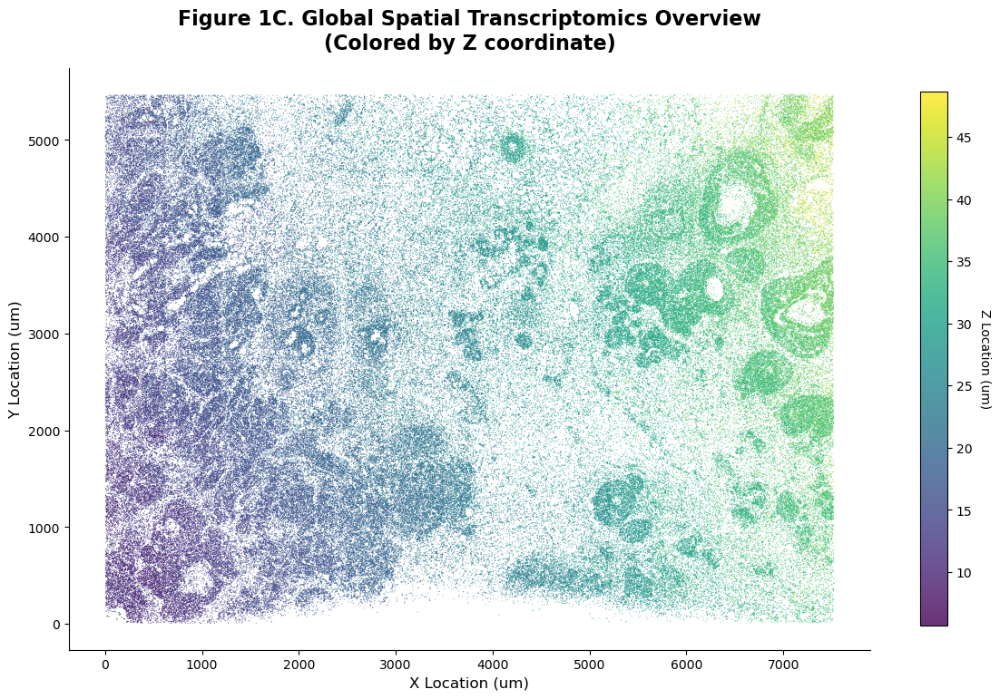

In [27]:
# ===========================================================================
# Part 3: Global Spatial Overview of the Tissue (Figure 1C)
# ===========================================================================

import matplotlib.pyplot as plt

# Reuse the same visualization sampling ratio as in Part 2.
# Sampling is used for plotting only and does not affect downstream calculations.
sample_fraction = 0.01
sample_seed = 412

sample_pd = df.sample(fraction=sample_fraction, seed=sample_seed).to_pandas()

fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot of transcripts in X-Y, color-coded by Z coordinate.
sc = ax.scatter(
    sample_pd["x_location"],
    sample_pd["y_location"],
    c=sample_pd["z_location"],
    cmap="viridis",
    s=0.5,
    alpha=0.8,
    edgecolors="none",
    rasterized=True,  # Reduce file size when saving vector graphics.
)

ax.set_title(
    "Figure 1C. Global Spatial Transcriptomics Overview\n(Colored by Z coordinate)",
    fontsize=16,
    fontweight="bold",
    pad=15,
)
ax.set_xlabel("X Location (um)", fontsize=12)
ax.set_ylabel("Y Location (um)", fontsize=12)

ax.set_aspect("equal")

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label("Z Location (um)", rotation=270, labelpad=15)

# Remove top/right spines for a cleaner overview plot.
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()

# Part 4: Spatial Grid Aggregation and Z-Stacking Index Profiling
# 第四部分：空间网格聚合与 Z-Stacking Index 轮廓分析

## 1. Histomorphological Concordance
## 1. 组织形态学一致性
To summarize localized spatial patterns while reducing sensitivity to large-scale Z-coordinate trends, we partitioned the tissue into fixed 20 × 20 µm grids (on the order of one to two cell diameters). The resulting grid-level transcript density map (Figure 2B) shows spatial patterns that are qualitatively consistent with the H&E whole-slide image (Figure 2A), including regions of higher and lower cellularity and areas with distinct tissue textures. This comparison provides a practical check that grid aggregation preserves major spatial structure at the chosen resolution.

为在汇总局部空间模式的同时降低对大尺度 Z 坐标趋势的敏感性，我们将组织划分为固定的 20 × 20 µm 空间网格（量级上约为 1–2 个细胞直径）。得到的网格级转录本密度图（图 2B）在空间模式上与 H&E 全切片图像（图 2A）呈现定性一致性，例如高/低细胞密度区域以及具有不同组织纹理的区域。该对照可作为一个实用的检查，用于确认在所选分辨率下网格聚合能够保留主要空间结构。

## 2. Z-Stacking Index: A Local Z-dispersion Metric
## 2. Z-Stacking Index：局部 Z 离散指标
To complement 2D density summaries, we define a geometric metric termed the Z-Stacking Index, computed as the standard deviation of transcript Z coordinates within each spatial grid. By focusing on within-grid dispersion rather than absolute Z depth, this metric is intended to capture local variation along the Z axis with reduced influence from slide-scale Z shifts.

Figure 2C visualizes the spatial distribution of the Z-Stacking Index. Regions with higher values indicate grids in which transcript Z coordinates are more dispersed, whereas lower values indicate more concentrated Z coordinates within the grid. Interpreting the biological sources of these patterns requires integration with molecular markers and/or histological context in later sections.

为补充 2D 密度摘要，我们定义了一个几何指标 Z-Stacking Index（Z 轴堆叠指数），其计算方式为每个网格内转录本 Z 坐标的标准差。该指标关注网格内部的离散程度而非绝对 Z 深度，旨在在降低玻片尺度 Z 漂移影响的前提下，刻画局部 Z 方向的变化。

图 2C 展示了 Z-Stacking Index 的空间分布。数值较高表示该网格内转录本 Z 坐标更为分散，数值较低则表示 Z 坐标在网格内更为集中。对这些模式的生物学来源进行解释，需要在后续章节结合分子标记和/或组织学信息进行综合分析。

## 3. Relationship Between Density and Z-Stacking Index
## 3. 密度与 Z-Stacking Index 的关系
Across 100,655 analyzed grids, transcript density and the Z-Stacking Index show a near-zero Pearson correlation (r = 0.0086) under the current grid size and filtering settings. This result indicates that, at least in terms of linear association, within-grid Z dispersion is not strongly coupled to transcript count per grid. In practice, this supports using the Z-Stacking Index as a complementary feature alongside density in subsequent unsupervised and differential analyses. This observation does not exclude potential non-linear relationships, which can be assessed separately if needed.

在当前网格尺寸与过滤设置下，对 100,655 个网格的分析显示，转录本密度与 Z-Stacking Index 的 Pearson 相关系数接近于零（r = 0.0086）。该结果表明，至少在线性关联意义上，网格内的 Z 离散程度与每网格转录本计数之间不存在显著耦合。在实际分析中，这支持将 Z-Stacking Index 与密度作为互补特征，用于后续的无监督分析与差异比较。需要说明的是，Pearson 相关接近于零并不排除非线性关系；如有需要，可在后续补充相应检验。

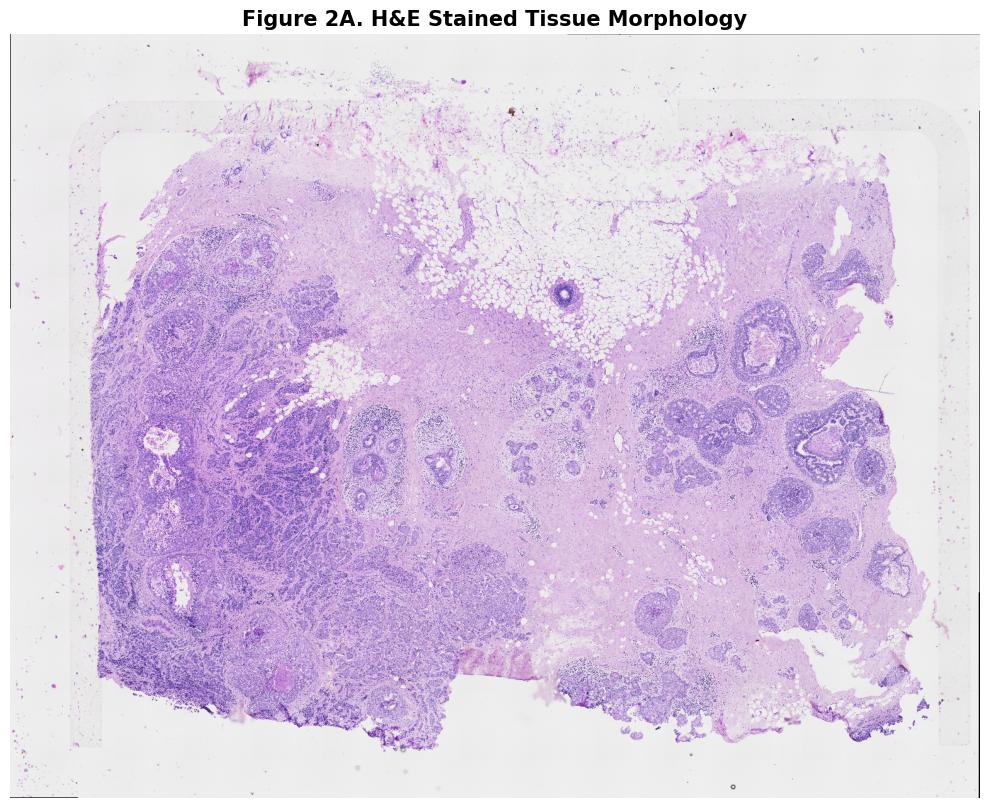

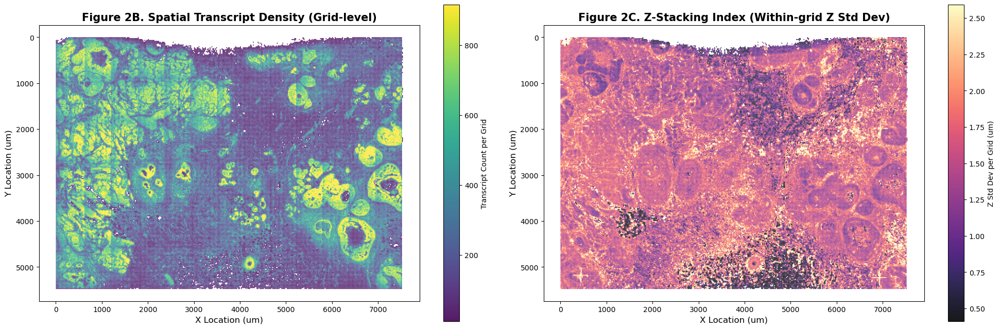

Spatial Grid Aggregation Summary
Total Valid Grids Analyzed : 100,760
Grid Resolution            : 20.0 x 20.0 um
Min Transcripts per Grid   : 10
Pearson Correlation (r)    : 0.0113


In [28]:
# ===========================================================================
# Part 4: Spatial Grid Aggregation and Z-Stacking Index Profiling
# ===========================================================================

import glob
import numpy as np
import matplotlib.pyplot as plt
import polars as pl
import tifffile

# ---------------------------------------------------------------------------
# 4.1 H&E Whole-Slide Image (WSI) Visualization
# ---------------------------------------------------------------------------
# Prefer OME-TIFF if available; fall back to standard TIFF patterns.
he_files = glob.glob(HE_IMAGE_PATTERNS[0]) or glob.glob(HE_IMAGE_PATTERNS[1])
if not he_files:
    raise FileNotFoundError(f"No H&E image found for patterns: {HE_IMAGE_PATTERNS}")

he_path = he_files[0]

# Downsample factor for visualization only.
# Larger values reduce memory usage and rendering time.
HE_DOWNSAMPLE_FACTOR = 20

with tifffile.TiffFile(he_path) as tif:
    he_arr = tif.series[0].asarray()

# Minimal handling for display:
# - If RGB-like (H, W, 3/4): keep first 3 channels.
# - If grayscale (H, W): display directly.
# - If other shapes: take the first plane.
if he_arr.ndim == 3 and he_arr.shape[-1] in (3, 4):
    he_img = he_arr[::HE_DOWNSAMPLE_FACTOR, ::HE_DOWNSAMPLE_FACTOR, :3]
elif he_arr.ndim == 2:
    he_img = he_arr[::HE_DOWNSAMPLE_FACTOR, ::HE_DOWNSAMPLE_FACTOR]
else:
    he_img = he_arr.reshape((-1,) + he_arr.shape[-2:])[0]
    he_img = he_img[::HE_DOWNSAMPLE_FACTOR, ::HE_DOWNSAMPLE_FACTOR]

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(he_img)
ax.set_title("Figure 2A. H&E Stained Tissue Morphology", fontsize=15, fontweight="bold")
ax.axis("off")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# 4.2 Spatial Grid Binning and Metric Aggregation
# ---------------------------------------------------------------------------
# Grid size (um). Prefer BIN_SIZE_UM if defined earlier; fall back to BIN_SIZE.
BIN_SIZE_UM = float(globals().get("BIN_SIZE_UM", globals().get("BIN_SIZE", 20.0)))

# Minimum number of transcripts required to compute within-grid Z dispersion.
MIN_TRANSCRIPTS_PER_GRID = 10

grid_pd = (
    df.lazy()
    .with_columns(
        (pl.col("x_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("x_bin"),
        (pl.col("y_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("y_bin"),
    )
    .group_by(["x_bin", "y_bin"])
    .agg(
        # Z-Stacking Index: within-grid standard deviation of Z coordinates (um).
        pl.col("z_location").std().alias("z_stacking_index_um"),
        pl.len().alias("transcript_count"),
    )
    .filter(pl.col("transcript_count") >= MIN_TRANSCRIPTS_PER_GRID)
    .collect()
    .to_pandas()
)

# Grid centroid coordinates (um).
grid_pd["x_um"] = grid_pd["x_bin"] * BIN_SIZE_UM + (BIN_SIZE_UM / 2.0)
grid_pd["y_um"] = grid_pd["y_bin"] * BIN_SIZE_UM + (BIN_SIZE_UM / 2.0)

# Drop bins where std could not be computed (e.g., degenerate cases).
grid_pd = grid_pd.dropna(subset=["z_stacking_index_um"]).copy()

# ---------------------------------------------------------------------------
# 4.3 Visualization: Transcript Density and Z-Stacking Index
# ---------------------------------------------------------------------------
fig, (ax_den, ax_zstd) = plt.subplots(1, 2, figsize=(20, 8))

# Clip extreme values for display to reduce dominance by outliers.
DENSITY_VMAX_Q = 0.98
ZSTD_VMIN_Q = 0.02
ZSTD_VMAX_Q = 0.98

density_vmax = grid_pd["transcript_count"].quantile(DENSITY_VMAX_Q)
zstd_vmin = grid_pd["z_stacking_index_um"].quantile(ZSTD_VMIN_Q)
zstd_vmax = grid_pd["z_stacking_index_um"].quantile(ZSTD_VMAX_Q)

# Figure 2B: transcript density map (grid-level counts)
sc1 = ax_den.scatter(
    grid_pd["x_um"],
    grid_pd["y_um"],
    c=grid_pd["transcript_count"],
    s=2,
    cmap="viridis",
    alpha=0.9,
    edgecolors="none",
    vmax=density_vmax,
    rasterized=True,
)
ax_den.set_title("Figure 2B. Spatial Transcript Density (Grid-level)", fontsize=15, fontweight="bold")
ax_den.set_xlabel("X Location (um)", fontsize=12)
ax_den.set_ylabel("Y Location (um)", fontsize=12)
ax_den.set_aspect("equal")
ax_den.invert_yaxis()
plt.colorbar(sc1, ax=ax_den, label="Transcript Count per Grid", shrink=0.8)

# Figure 2C: Z-Stacking Index map (within-grid Z std)
sc2 = ax_zstd.scatter(
    grid_pd["x_um"],
    grid_pd["y_um"],
    c=grid_pd["z_stacking_index_um"],
    s=2,
    cmap="magma",
    alpha=0.9,
    edgecolors="none",
    vmin=zstd_vmin,
    vmax=zstd_vmax,
    rasterized=True,
)
ax_zstd.set_title("Figure 2C. Z-Stacking Index (Within-grid Z Std Dev)", fontsize=15, fontweight="bold")
ax_zstd.set_xlabel("X Location (um)", fontsize=12)
ax_zstd.set_ylabel("Y Location (um)", fontsize=12)
ax_zstd.set_aspect("equal")
ax_zstd.invert_yaxis()
plt.colorbar(sc2, ax=ax_zstd, label="Z Std Dev per Grid (um)", shrink=0.8)

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# 4.4 Correlation Summary (Density vs Z-Stacking Index)
# ---------------------------------------------------------------------------
pearson_r = float(grid_pd["transcript_count"].corr(grid_pd["z_stacking_index_um"]))

print("=" * 55)
print("Spatial Grid Aggregation Summary")
print("=" * 55)
print(f"Total Valid Grids Analyzed : {len(grid_pd):,}")
print(f"Grid Resolution            : {BIN_SIZE_UM:.1f} x {BIN_SIZE_UM:.1f} um")
print(f"Min Transcripts per Grid   : {MIN_TRANSCRIPTS_PER_GRID}")
print(f"Pearson Correlation (r)    : {pearson_r:.4f}")
print("=" * 55)

# Part 5: Unsupervised Spatial Clustering via Physical Features
# 第五部分：基于物理特征的无监督空间聚类

## 1. Feature Space Engineering and GMM Modeling
## 1. 特征空间工程与 GMM 建模
To summarize grid-level spatial structure without using gene identity, we performed unsupervised clustering using two physical features defined in Part 4: log-transformed transcript count per grid (as a density proxy) and the Z-Stacking Index (within-grid Z standard deviation). We fitted a Gaussian Mixture Model (GMM) with three components to the standardized feature space. Here, the choice of three components is an analysis setting for this notebook and can be evaluated further with model-selection criteria (e.g., BIC/AIC) if required.

为在不使用基因身份信息的情况下对网格级空间结构进行概括，我们基于第四部分定义的两个物理特征进行无监督聚类：每网格转录本计数的对数变换（作为密度的代理指标）与 Z-Stacking Index（网格内 Z 坐标的标准差）。我们在标准化后的特征空间中拟合了包含三个组分的高斯混合模型（GMM）。在本 Notebook 中，三个组分的设置作为分析参数使用；如有需要，可进一步通过模型选择准则（如 BIC/AIC）进行评估。

## 2. Separation of Grid Domains in Feature Space
## 2. 特征空间中的网格区域分离
The feature-space plot (Figure 3B) shows that the grids occupy distinct regions under these two physical summaries. Interpreting each cluster is based on its location in the (log density, Z-Stacking Index) plane:
* Cluster 0 (light gray): low transcript count per grid and low Z dispersion. These grids are consistent with low-signal regions and may include background or sparsely populated areas.
* Cluster 1 (orange): intermediate transcript count per grid with higher Z dispersion. This cluster represents grids where transcript Z coordinates are more spread within the bin.
* Cluster 2 (blue): higher transcript count per grid with comparatively lower Z dispersion. This cluster represents grids with higher lateral concentration of transcripts while the within-grid Z spread is more constrained.

特征空间图（图 3B）显示，在这两个物理摘要特征下，不同网格分布在相对分离的区域。对各聚类的解释基于其在（对数密度、Z-Stacking Index）平面中的位置：
* Cluster 0（浅灰）：每网格转录本计数较低且 Z 离散程度较低。这些网格与低信号区域相一致，可能包括背景或转录本较稀疏的区域。
* Cluster 1（橙色）：每网格转录本计数处于中间水平，但 Z 离散程度较高。该类网格的特征是网格内转录本 Z 坐标分布更为分散。
* Cluster 2（蓝色）：每网格转录本计数较高，且 Z 离散程度相对较低。该类网格表现为转录本在平面内更为集中，而网格内的 Z 扩散较受限。

## 3. Spatial Projection and Setup for Molecular Interpretation
## 3. 空间投影与分子解释的准备
Projecting cluster labels back to tissue coordinates (Figure 3A) highlights spatial organization at the grid level. In this dataset, Cluster 2 appears as compact, high-density regions, whereas Cluster 1 tends to occupy more interconnected or surrounding areas relative to Cluster 2. These patterns provide a basis for subsequent molecular analyses, but the biological interpretation of clusters is not assigned at this stage.

To relate the geometry-defined clusters to transcriptional programs, we next compare gene expression between clusters using spatial differential expression (DGE) and pathway-level summaries.

将聚类标签映射回组织坐标（图 3A）可以观察到网格级别的空间组织结构。在该数据集中，Cluster 2 更常见于较为致密的高密度区域，而 Cluster 1 相对更常见于围绕或穿插于 Cluster 2 的区域。这些空间模式为后续分子层面的分析提供了切入点，但在此阶段我们不对聚类直接赋予确定的生物学身份。

为将几何定义的聚类与转录程序联系起来，我们将在下一步通过空间差异表达（DGE）与通路层面的汇总分析，对聚类间的分子差异进行比较。

Running unsupervised clustering on grid-level physical features...
-------------------------------------------------------
Median physical properties by cluster:
  - Cluster 0: median_count=77.0, median_z_std=0.8408
  - Cluster 1: median_count=183.0, median_z_std=1.7551
  - Cluster 2: median_count=542.0, median_z_std=1.5378
-------------------------------------------------------
Grid allocation by cluster:
region
Cluster 0    12565
Cluster 1    44167
Cluster 2    44028
Name: count, dtype: int64


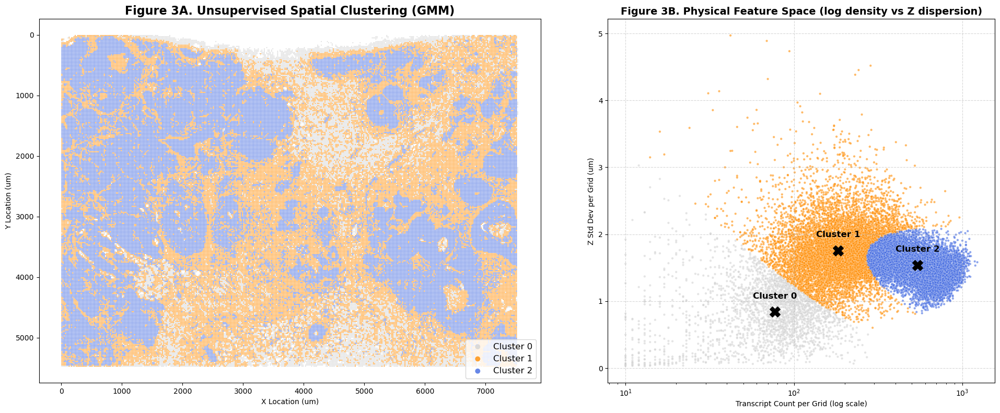

In [29]:
# ===========================================================================
# Part 5: Unsupervised Spatial Clustering via Physical Features (GMM)
# ===========================================================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------------------
# 5.1 Feature engineering (grid-level physical summaries)
# ---------------------------------------------------------------------------
# Clustering features:
# 1) log_density: log1p(transcript_count per grid)
# 2) z_stacking_index: within-grid Z standard deviation (um)
#
# This step uses only geometric/count summaries and does not use gene identity.
required_cols = {"transcript_count"}
missing = required_cols - set(grid_pd.columns)
if missing:
    raise ValueError(f"`grid_pd` missing required columns: {sorted(missing)}")

# Support both column naming conventions from Part 4.
z_col = "z_stacking_index_um" if "z_stacking_index_um" in grid_pd.columns else "z_stacking_index"
if z_col not in grid_pd.columns:
    raise ValueError("Missing Z-dispersion column. Expected `z_stacking_index_um` or `z_stacking_index`.")

x_col = "x_um" if "x_um" in grid_pd.columns else "x_phys"
y_col = "y_um" if "y_um" in grid_pd.columns else "y_phys"
if x_col not in grid_pd.columns or y_col not in grid_pd.columns:
    raise ValueError("Missing grid centroid coordinates. Expected (`x_um`, `y_um`) or (`x_phys`, `y_phys`).")

X_df = grid_pd[["transcript_count", z_col]].copy()
X_df["log_density"] = np.log1p(X_df["transcript_count"])

# Standardization (z-score) to put features on comparable scale.
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_df[["log_density", z_col]])

# ---------------------------------------------------------------------------
# 5.2 Model training: Gaussian Mixture Model
# ---------------------------------------------------------------------------
print("=" * 55)
print("Running unsupervised clustering on grid-level physical features...")

N_COMPONENTS = 3
RANDOM_SEED = 412

gmm = GaussianMixture(
    n_components=N_COMPONENTS,
    random_state=RANDOM_SEED,
    covariance_type="full",
)
grid_pd["cluster_id"] = gmm.fit_predict(X_scaled)

# ---------------------------------------------------------------------------
# 5.3 Cluster relabeling for stable display
# ---------------------------------------------------------------------------
# Remap cluster labels by median transcript_count (ascending).
# This is for consistent visualization; it does not change model assignment.
median_density = (
    grid_pd.groupby("cluster_id")["transcript_count"].median().sort_values()
)
sort_map = {old_id: new_id for new_id, old_id in enumerate(median_density.index)}

grid_pd["cluster_sorted"] = grid_pd["cluster_id"].map(sort_map)
grid_pd["region"] = "Cluster " + grid_pd["cluster_sorted"].astype(str)

# Keep a copy for downstream steps.
target_grids = grid_pd.copy()

# ---------------------------------------------------------------------------
# 5.4 Output summary statistics
# ---------------------------------------------------------------------------
print("-" * 55)
print("Median physical properties by cluster:")
cluster_stats = grid_pd.groupby("region")[["transcript_count", z_col]].median()

for region in sorted(grid_pd["region"].unique()):
    density_med = float(cluster_stats.loc[region, "transcript_count"])
    z_med = float(cluster_stats.loc[region, z_col])
    print(f"  - {region}: median_count={density_med:.1f}, median_z_std={z_med:.4f}")

print("-" * 55)
print("Grid allocation by cluster:")
print(grid_pd["region"].value_counts().sort_index())
print("=" * 55)

# ---------------------------------------------------------------------------
# 5.5 Visualization: spatial map and feature space
# ---------------------------------------------------------------------------
fig, (ax_map, ax_feat) = plt.subplots(
    1,
    2,
    figsize=(20, 8),
    gridspec_kw={"width_ratios": [1.5, 1]},
)

# Palette aligned to sorted cluster labels.
palette = {
    "Cluster 0": "lightgray",
    "Cluster 1": "darkorange",
    "Cluster 2": "royalblue",
}

# Plot A: spatial distribution of clusters (grid centroids)
for label in sorted(palette.keys()):
    sub = grid_pd[grid_pd["region"] == label]
    ax_map.scatter(
        sub[x_col],
        sub[y_col],
        s=2,
        c=palette[label],
        alpha=0.8,
        edgecolors="none",
        label=label,
        rasterized=True,
    )

ax_map.set_title("Figure 3A. Unsupervised Spatial Clustering (GMM)", fontsize=16, fontweight="bold")
ax_map.set_xlabel("X Location (um)")
ax_map.set_ylabel("Y Location (um)")
ax_map.invert_yaxis()
ax_map.legend(markerscale=5, loc="lower right", fontsize=12, frameon=True)
ax_map.set_aspect("equal")

# Plot B: feature space (subsample for rendering)
PLOT_MAX_POINTS = 20000
plot_df = grid_pd.sample(n=min(PLOT_MAX_POINTS, len(grid_pd)), random_state=42)

sns.scatterplot(
    data=plot_df,
    x="transcript_count",
    y=z_col,
    hue="region",
    palette=palette,
    s=10,
    alpha=0.6,
    ax=ax_feat,
    legend=False,
)

# Annotate medians (robust centers for display)
centroids = grid_pd.groupby("region")[["transcript_count", z_col]].median()
for label, row in centroids.iterrows():
    ax_feat.scatter(row["transcript_count"], row[z_col], s=200, c="black", marker="X", zorder=10)
    ax_feat.text(
        row["transcript_count"],
        row[z_col] + 0.2,
        label,
        fontsize=12,
        fontweight="bold",
        ha="center",
    )

ax_feat.set_xscale("log")
ax_feat.set_title("Figure 3B. Physical Feature Space (log density vs Z dispersion)", fontsize=14, fontweight="bold")
ax_feat.set_xlabel("Transcript Count per Grid (log scale)")
ax_feat.set_ylabel("Z Std Dev per Grid (um)")
ax_feat.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

# Part 6: Spatial Differential Gene Expression (DGE) Analysis
# 第六部分：空间差异基因表达（DGE）分析

## 1. Grid-Level Quantitative Profiling
## 1. 网格级定量分析
To compare transcriptional differences between the geometry-defined groups, we constructed a grid-level gene count matrix and normalized counts to counts per million (CPM) to account for variation in total transcripts per grid. We then tested each gene between the High Z-Var (Cluster 1) and Low Z-Var (Cluster 2) groups using the non-parametric Mann–Whitney U test, followed by Benjamini–Hochberg FDR correction. For reporting, we applied practical thresholds on effect size and abundance (|log2 fold change| ≥ 1.5, mean CPM ≥ 100.0) together with an FDR threshold (q < 0.001). Under these analysis settings, a subset of genes met the practical criteria and were retained for downstream visualization.

为比较几何定义组之间的转录差异，我们构建了网格级的基因计数矩阵，并将计数标准化为每百万计数（CPM），以校正网格间总转录本数的差异。随后，我们对高 Z-Var（Cluster 1）与低 Z-Var（Cluster 2）两组在每个基因上进行非参数 Mann–Whitney U 检验，并采用 Benjamini–Hochberg 方法进行 FDR 校正。为便于汇报与可视化，我们在统计显著性阈值（q < 0.001）之外，同时设置了效应量与丰度的实际阈值（|log2 倍数变化| ≥ 1.5，平均 CPM ≥ 100.0）。在这些分析设置下，满足实际筛选条件的一部分基因被保留用于后续展示。

## 2. Distinct Marker Sets Between Geometry-Defined Groups
## 2. 几何定义组之间的差异标记基因
Without assigning biological identities a priori, the filtered DGE results highlight distinct marker sets between the two groups. The Low Z-Var group shows higher expression of epithelial-associated transcripts (e.g., `EPCAM`, `KRT8`, `KRT7`) and proliferation-associated genes (e.g., `TOP2A`, `CENPF`), whereas the High Z-Var group shows higher expression of genes previously reported in adipose/lipid-related programs (e.g., `ADIPOQ`, `LEP`, `LPL`), extracellular matrix remodeling (e.g., `MMP2`, `SFRP4`), and immune-associated effectors (e.g., `GZMB`, `IL2RA`). These associations are descriptive and provide hypotheses for subsequent pathway-level and spatial contextualization.

在不预设生物学身份的前提下，经过筛选的 DGE 结果提示两组具有不同的标记基因集合。低 Z-Var 组相对更高表达上皮相关转录本（如 `EPCAM`、`KRT8`、`KRT7`）及增殖相关基因（如 `TOP2A`、`CENPF`）；而高 Z-Var 组相对更高表达在既往研究中常与脂肪/脂质相关程序（如 `ADIPOQ`、`LEP`、`LPL`）、细胞外基质重塑（如 `MMP2`、`SFRP4`）以及免疫相关效应分子（如 `GZMB`、`IL2RA`）相关的基因。这些对应关系在此处作为描述性总结，用于为后续通路层面分析与空间语境化提供可检验的假设。

## 3. Implications and Next Steps
## 3. 含义与后续步骤
Together, these results suggest that the two geometry-defined groups capture differences that are not limited to transcript abundance, but are accompanied by distinct transcriptional programs. However, marker lists alone are not sufficient to characterize functional states or underlying mechanisms. To interpret these patterns more systematically, we next perform pathway enrichment and spatial visualization to assess whether the observed gene sets show coherent functional themes and how they distribute across the tissue section.

综合来看，这些结果提示：两类几何定义组的差异不仅体现为转录本丰度的变化，同时伴随不同的转录程序。但仅凭标记基因列表不足以充分刻画功能状态或推断机制。为更系统地解释这些模式，我们将在下一步进行通路富集与空间可视化，以评估相关基因集合是否呈现一致的功能主题，并观察其在组织中的空间分布。

In [30]:
# ===========================================================================
# Part 6: Spatial Differential Gene Expression (DGE)
# Grid-level Mann-Whitney U test with BH-FDR correction
# ===========================================================================

import warnings

import numpy as np
import pandas as pd
import polars as pl
from scipy import stats
from statsmodels.stats.multitest import multipletests

# ---------------------------------------------------------------------------
# 6.1 Group assignment from GMM clusters
# ---------------------------------------------------------------------------
# Exclude low-density Cluster 0; compare Cluster 1 vs Cluster 2.
target_grids_dge = grid_pd.loc[grid_pd["cluster_sorted"] != 0].copy()

cluster_to_group = {
    1: "High_Z_Var_Group",
    2: "Low_Z_Var_Group",
}
target_grids_dge["dge_group"] = target_grids_dge["cluster_sorted"].map(cluster_to_group)

print("=" * 65)
print("DGE Group Allocation (Based on GMM Clusters)")
print("=" * 65)
print(target_grids_dge["dge_group"].value_counts())
print("-" * 65)

# ---------------------------------------------------------------------------
# 6.2 Grid-level gene count matrix
# ---------------------------------------------------------------------------
# Bin size (um). Prefer BIN_SIZE_UM if defined; fall back to BIN_SIZE.
BIN_SIZE_UM = float(globals().get("BIN_SIZE_UM", globals().get("BIN_SIZE", 20.0)))

if "df_binned" not in globals():
    df_binned = df.with_columns(
        (pl.col("x_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("x_bin"),
        (pl.col("y_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("y_bin"),
    )

df_binned_lf = df_binned if isinstance(df_binned, pl.LazyFrame) else df_binned.lazy()

group_map_lf = pl.from_pandas(
    target_grids_dge[["x_bin", "y_bin", "dge_group"]]
).lazy()

# Count transcripts per (grid, gene) within the selected groups.
grid_gene_counts = (
    df_binned_lf.join(group_map_lf, on=["x_bin", "y_bin"], how="inner")
    .group_by(["x_bin", "y_bin", "dge_group", "feature_name"])
    .agg(pl.len().alias("count"))
    .collect()
    .to_pandas()
)

# Pivot to a Grid x Gene matrix; index carries (x_bin, y_bin, group).
grid_matrix = (
    grid_gene_counts.pivot(
        index=["x_bin", "y_bin", "dge_group"],
        columns="feature_name",
        values="count",
    )
    .fillna(0)
)

# ---------------------------------------------------------------------------
# 6.3 CPM normalization (per grid)
# ---------------------------------------------------------------------------
grid_lib_size = grid_matrix.sum(axis=1)

grid_cpm = grid_matrix.div(grid_lib_size.replace(0, np.nan), axis=0) * 1e6
grid_cpm = grid_cpm.fillna(0)

group_idx = grid_cpm.index.get_level_values("dge_group")
high_cpm = grid_cpm.loc[group_idx == "High_Z_Var_Group"]
low_cpm = grid_cpm.loc[group_idx == "Low_Z_Var_Group"]

# ---------------------------------------------------------------------------
# 6.4 Statistical testing and effect summary (per gene)
# ---------------------------------------------------------------------------
print("Running grid-level Mann-Whitney U tests (two-sided)...")

genes = grid_cpm.columns.tolist()
epsilon = 1.0  # Pseudocount for log2 fold change on mean CPM.

rows = []

# Suppress warnings from tied ranks or degenerate inputs.
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    for gene in genes:
        x = high_cpm[gene].to_numpy(dtype=float)
        y = low_cpm[gene].to_numpy(dtype=float)

        mean_high = float(np.mean(x))
        mean_low = float(np.mean(y))
        mean_cpm_avg = 0.5 * (mean_high + mean_low)

        log2fc = float(np.log2((mean_high + epsilon) / (mean_low + epsilon)))

        if np.var(x) == 0.0 and np.var(y) == 0.0:
            p_val = 1.0
        else:
            # Mann-Whitney U is equivalent to Wilcoxon rank-sum for independent samples.
            _, p_val = stats.mannwhitneyu(x, y, alternative="two-sided")

        rows.append(
            {
                "feature_name": gene,
                "High_Z_Var_Group_CPM": mean_high,
                "Low_Z_Var_Group_CPM": mean_low,
                "Mean_CPM": mean_cpm_avg,
                "log2FC": log2fc,
                "pval": float(p_val),
            }
        )

dge_results = pd.DataFrame(rows).set_index("feature_name")

# ---------------------------------------------------------------------------
# 6.5 Multiple-testing correction (BH-FDR) and practical filters
# ---------------------------------------------------------------------------
_, qvals, _, _ = multipletests(dge_results["pval"].fillna(1.0), method="fdr_bh")
dge_results["qval"] = qvals
dge_results["nlog10_qval"] = -np.log10(dge_results["qval"] + 1e-300)

# Practical significance thresholds (analysis settings).
# - abs(log2FC): minimum effect size on mean CPM (with pseudocount epsilon)
# - Mean_CPM: minimum average abundance across the two groups
# - qval: BH-FDR threshold
FC_THRESHOLD = 1.5
MEAN_CPM_THRESHOLD = 100.0
Q_THRESHOLD = 0.001

dge_results["is_stat_sig"] = dge_results["qval"] < Q_THRESHOLD
dge_results["is_practical_sig"] = (
    dge_results["is_stat_sig"]
    & (dge_results["log2FC"].abs() >= FC_THRESHOLD)
    & (dge_results["Mean_CPM"] >= MEAN_CPM_THRESHOLD)
)

dge_practical = dge_results.loc[dge_results["is_practical_sig"]].copy()

# ---------------------------------------------------------------------------
# 6.6 Summary tables (top markers by direction)
# ---------------------------------------------------------------------------
def format_q(q: float) -> str:
    return "q < 1e-300" if q < 1e-300 else f"{q:.3e}"

top_n = 15
top_high = dge_practical.sort_values("log2FC", ascending=False).head(top_n)
top_low = dge_practical.sort_values("log2FC", ascending=True).head(top_n)

summary = (
    pd.concat([top_high, top_low])
    .reset_index()
    .drop_duplicates(subset=["feature_name"], keep="first")
)

summary["Direction"] = np.where(summary["log2FC"] > 0, "High_Z_Var_Group", "Low_Z_Var_Group")
summary["q-value"] = summary["qval"].map(format_q)

dge_summary = summary[
    [
        "feature_name",
        "Direction",
        "log2FC",
        "Mean_CPM",
        "High_Z_Var_Group_CPM",
        "Low_Z_Var_Group_CPM",
        "q-value",
    ]
].rename(columns={"feature_name": "Gene"})

# Format for display
dge_summary["log2FC"] = dge_summary["log2FC"].round(3)
dge_summary["Mean_CPM"] = dge_summary["Mean_CPM"].round(1)
dge_summary["High_Z_Var_Group_CPM"] = dge_summary["High_Z_Var_Group_CPM"].round(1)
dge_summary["Low_Z_Var_Group_CPM"] = dge_summary["Low_Z_Var_Group_CPM"].round(1)

print("=" * 65)
print(f"DGE Summary: {int(dge_results['is_practical_sig'].sum())} practical markers")
print(f"  Thresholds: |log2FC| >= {FC_THRESHOLD}, Mean_CPM >= {MEAN_CPM_THRESHOLD}, q < {Q_THRESHOLD}")
print(f"  High_Z_Var_Group: {int((dge_practical['log2FC'] > 0).sum())} genes")
print(f"  Low_Z_Var_Group : {int((dge_practical['log2FC'] < 0).sum())} genes")
print("-" * 65)

print(f"Top Markers Enriched in High_Z_Var_Group (n={min(top_n, len(top_high))}):")
if not top_high.empty:
    print(dge_summary.loc[dge_summary["Direction"] == "High_Z_Var_Group"].to_string(index=False))
else:
    print("  No genes met the practical thresholds.")
print("-" * 65)

print(f"Top Markers Enriched in Low_Z_Var_Group (n={min(top_n, len(top_low))}):")
if not top_low.empty:
    print(dge_summary.loc[dge_summary["Direction"] == "Low_Z_Var_Group"].to_string(index=False))
else:
    print("  No genes met the practical thresholds.")
print("=" * 65)

DGE Group Allocation (Based on GMM Clusters)
dge_group
High_Z_Var_Group    44167
Low_Z_Var_Group     44028
Name: count, dtype: int64
-----------------------------------------------------------------
Running grid-level Mann-Whitney U tests (two-sided)...
DGE Summary: 28 practical markers
  Thresholds: |log2FC| >= 1.5, Mean_CPM >= 100.0, q < 0.001
  High_Z_Var_Group: 17 genes
  Low_Z_Var_Group : 11 genes
-----------------------------------------------------------------
Top Markers Enriched in High_Z_Var_Group (n=15):
            Gene        Direction  log2FC  Mean_CPM  High_Z_Var_Group_CPM  Low_Z_Var_Group_CPM    q-value
          ADIPOQ High_Z_Var_Group   3.416     866.8                1585.8                147.7 q < 1e-300
             LEP High_Z_Var_Group   2.854     121.2                 213.8                 28.7  2.963e-62
            GZMB High_Z_Var_Group   2.651    1213.8                2095.0                332.7 q < 1e-300
antisense_PROKR2 High_Z_Var_Group   2.405     845.8    

# Part 7: Visualization of the Spatial Differential Expression Landscape
# 第七部分：空间差异表达景观的可视化

## 1. Diverging Marker Profiles
## 1. 分化的标记基因轮廓
To summarize the direction and magnitude of differential expression between the two geometry-defined groups, we visualized the top-ranked genes (by effect size) using a diverging lollipop chart (Figure 4A). The chart displays the top 15 genes with higher mean CPM in the High Z-Var group and the top 15 genes with higher mean CPM in the Low Z-Var group under the practical filtering settings defined in Part 6. Node size reflects mean CPM, providing a joint view of relative change and average abundance.

为概览两类几何定义组之间差异表达的方向与幅度，我们使用发散型棒棒糖图对排名靠前的基因进行可视化（图 4A）。在第六部分所定义的实际筛选设置下，该图分别展示了在高 Z-Var 组中平均 CPM 更高的前 15 个基因，以及在低 Z-Var 组中平均 CPM 更高的前 15 个基因。节点大小与平均 CPM 对应，用于同时呈现相对变化与平均丰度。

In this dataset, the genes highlighted for the Low Z-Var group include multiple epithelial-associated markers (e.g., *KRT8*, *KRT7*, *EPCAM*) and additional tumor-associated targets (e.g., *TACSTD2*). The High Z-Var group includes genes previously reported in adipose/lipid-related programs (e.g., *ADIPOQ*, *LEP*) and immune-associated effectors (e.g., *GZMB*). These observations are descriptive and motivate follow-up analyses that integrate additional molecular context.

在该数据集中，低 Z-Var 组的高表达基因包含多种上皮相关标记（如 *KRT8*、*KRT7*、*EPCAM*）以及其他肿瘤相关靶点（如 *TACSTD2*）。高 Z-Var 组的高表达基因则包含在既往研究中常与脂肪/脂质相关程序（如 *ADIPOQ*、*LEP*）及免疫相关效应分子（如 *GZMB*）相关的基因。这些结果在此处作为描述性总结，用于提示后续需要结合更多分子证据进行解释。

## 2. Global Expression Comparison
## 2. 全局表达对比
To provide a global view of expression differences, we plotted each gene by its mean CPM in the Low Z-Var group versus the High Z-Var group (Figure 4B), using a log1p transformation for display. Most genes cluster near the diagonal, indicating similar mean CPM across the two groups for a large fraction of the panel. Genes highlighted by the practical criteria deviate from the diagonal and represent candidates with larger group differences under the selected thresholds. This plot is used as a visual summary and should be interpreted together with the statistical testing and multiple-testing correction reported in Part 6.

为提供全局层面的表达差异概览，我们将每个基因在低 Z-Var 组与高 Z-Var 组中的平均 CPM 进行对照绘制（图 4B），并在展示时采用 log1p 变换。多数基因聚集在对角线附近，表明在相当一部分基因上两组的平均 CPM 接近。满足实际筛选条件的基因偏离对角线，代表在所选阈值下组间差异更大的候选基因。该图用于可视化汇总，需与第六部分的统计检验与多重校正结果结合解读。

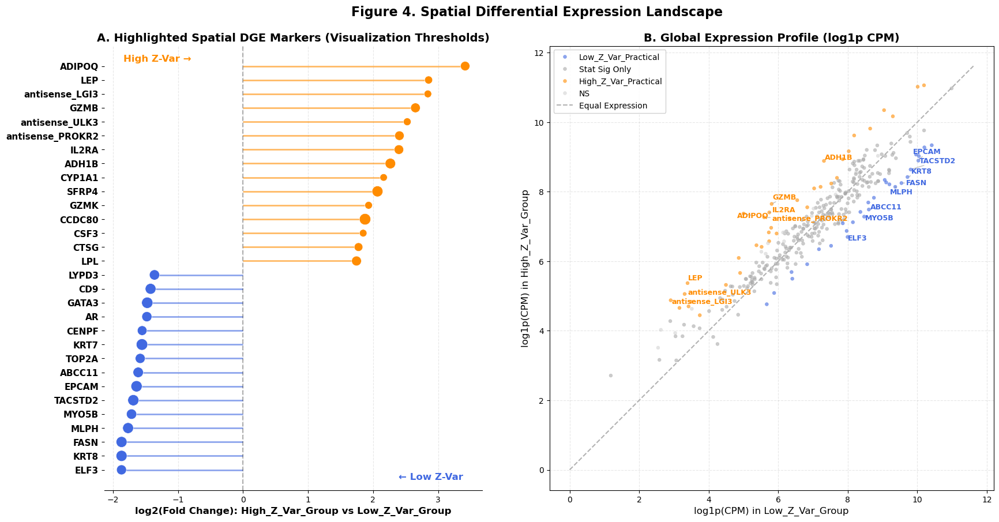

In [31]:
# ===========================================================================
# Part 7: Visualization of Spatial Differential Gene Expression (GMM-adapted)
# ===========================================================================
# This section visualizes DGE results from Part 6.
# Thresholds here are for visualization emphasis and are not the same as the
# practical thresholds used to define dge_practical.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from adjustText import adjust_text

# ---------------------------------------------------------------------------
# 7.1 Visualization thresholds (for highlighting points)
# ---------------------------------------------------------------------------
FC_THRESH_VIS = 1.0
Q_THRESH_VIS = 0.01
MEAN_CPM_THRESH_VIS = 50.0

# Expected columns:
# log2FC, qval, Mean_CPM, High_Z_Var_Group_CPM, Low_Z_Var_Group_CPM
required_cols = {
    "log2FC",
    "qval",
    "Mean_CPM",
    "High_Z_Var_Group_CPM",
    "Low_Z_Var_Group_CPM",
}
missing = required_cols - set(dge_results.columns)
if missing:
    raise ValueError(f"`dge_results` missing required columns: {sorted(missing)}")

# Vectorized categorization for plotting.
is_stat = dge_results["qval"] < Q_THRESH_VIS
is_effect = dge_results["log2FC"].abs() >= FC_THRESH_VIS
is_abund = dge_results["Mean_CPM"] >= MEAN_CPM_THRESH_VIS
is_vis_practical = is_stat & is_effect & is_abund

category = np.full(len(dge_results), "NS", dtype=object)
category[is_stat.to_numpy()] = "Stat Sig Only"

up = is_vis_practical & (dge_results["log2FC"] > 0)
down = is_vis_practical & (dge_results["log2FC"] < 0)
category[up.to_numpy()] = "High_Z_Var_Practical"
category[down.to_numpy()] = "Low_Z_Var_Practical"

dge_results = dge_results.copy()
dge_results["category"] = category

# ---------------------------------------------------------------------------
# 7.2 Select top genes for annotation and lollipop display
# ---------------------------------------------------------------------------
TOP_N_EACH_SIDE = 15
LABEL_N_EACH_SIDE = 8  # number of genes to label in the scatter plot

top_high = (
    dge_results.loc[dge_results["category"] == "High_Z_Var_Practical"]
    .sort_values("log2FC", ascending=False)
    .head(TOP_N_EACH_SIDE)
)
top_low = (
    dge_results.loc[dge_results["category"] == "Low_Z_Var_Practical"]
    .sort_values("log2FC", ascending=True)
    .head(TOP_N_EACH_SIDE)
)

plot_data = (
    pd.concat([top_high, top_low])
    .reset_index()  # expose gene names for y-axis labels
    .rename(columns={"feature_name": "Gene"})
    .sort_values("log2FC")
)

# ---------------------------------------------------------------------------
# 7.3 Initialize dual-panel figure layout
# ---------------------------------------------------------------------------
fig = plt.figure(figsize=(20, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 1.2], wspace=0.15)

ax_lollipop = fig.add_subplot(gs[0, 0])
ax_scatter = fig.add_subplot(gs[0, 1])

# ===========================================================================
# 7.4 Panel A: Diverging lollipop chart
# ===========================================================================
y_pos = np.arange(len(plot_data))

colors = np.where(plot_data["log2FC"] < 0, "royalblue", "darkorange")

ax_lollipop.hlines(
    y=y_pos,
    xmin=0,
    xmax=plot_data["log2FC"],
    color=colors,
    alpha=0.6,
    linewidth=2,
)

# Node size reflects mean CPM (log-scaled).
size_factor = np.log1p(plot_data["Mean_CPM"].to_numpy(dtype=float)) * 20.0
ax_lollipop.scatter(
    plot_data["log2FC"],
    y_pos,
    color=colors,
    s=size_factor,
    alpha=1.0,
    zorder=3,
    edgecolors="white",
    linewidth=0.5,
)

ax_lollipop.axvline(0, color="black", alpha=0.3, linestyle="--")
ax_lollipop.set_yticks(y_pos)
ax_lollipop.set_yticklabels(plot_data["Gene"], fontsize=11, fontweight="bold")
ax_lollipop.set_xlabel("log2(Fold Change): High_Z_Var_Group vs Low_Z_Var_Group", fontsize=12, fontweight="bold")
ax_lollipop.set_title("A. Highlighted Spatial DGE Markers (Visualization Thresholds)", fontsize=14, fontweight="bold")

ax_lollipop.text(
    0.05,
    0.98,
    "High Z-Var →",
    transform=ax_lollipop.transAxes,
    color="darkorange",
    ha="left",
    va="top",
    fontsize=12,
    fontweight="bold",
)
ax_lollipop.text(
    0.95,
    0.02,
    "← Low Z-Var",
    transform=ax_lollipop.transAxes,
    color="royalblue",
    ha="right",
    va="bottom",
    fontsize=12,
    fontweight="bold",
)

for spine in ["top", "right", "left"]:
    ax_lollipop.spines[spine].set_visible(False)
ax_lollipop.grid(axis="x", linestyle="--", alpha=0.3)

# ===========================================================================
# 7.5 Panel B: Global expression scatter (log1p CPM)
# ===========================================================================
x_col = "Low_Z_Var_Group_CPM"
y_col = "High_Z_Var_Group_CPM"

plot_scatter_df = dge_results.copy()
plot_scatter_df["x_val"] = np.log1p(plot_scatter_df[x_col].to_numpy(dtype=float))
plot_scatter_df["y_val"] = np.log1p(plot_scatter_df[y_col].to_numpy(dtype=float))

palette = {
    "High_Z_Var_Practical": "darkorange",
    "Low_Z_Var_Practical": "royalblue",
    "Stat Sig Only": "darkgray",
    "NS": "lightgray",
}

sns.scatterplot(
    data=plot_scatter_df,
    x="x_val",
    y="y_val",
    hue="category",
    palette=palette,
    s=18,
    alpha=0.6,
    edgecolor=None,
    ax=ax_scatter,
    legend=True,
    rasterized=True,
)

lims_max = float(max(plot_scatter_df["x_val"].max(), plot_scatter_df["y_val"].max()) * 1.05)
lims = [0.0, lims_max]
ax_scatter.plot(lims, lims, "k--", alpha=0.3, zorder=0, label="Equal Expression")

# Annotate a small subset for readability.
texts = []
for gene, row in top_high.head(LABEL_N_EACH_SIDE).iterrows():
    texts.append(
        ax_scatter.text(
            np.log1p(row[x_col]),
            np.log1p(row[y_col]),
            gene,
            color="darkorange",
            fontsize=9,
            fontweight="bold",
        )
    )
for gene, row in top_low.head(LABEL_N_EACH_SIDE).iterrows():
    texts.append(
        ax_scatter.text(
            np.log1p(row[x_col]),
            np.log1p(row[y_col]),
            gene,
            color="royalblue",
            fontsize=9,
            fontweight="bold",
        )
    )

if texts:
    adjust_text(texts, ax=ax_scatter, arrowprops=dict(arrowstyle="-", color="gray", alpha=0.5))

ax_scatter.set_title("B. Global Expression Profile (log1p CPM)", fontsize=14, fontweight="bold")
ax_scatter.set_xlabel("log1p(CPM) in Low_Z_Var_Group", fontsize=12)
ax_scatter.set_ylabel("log1p(CPM) in High_Z_Var_Group", fontsize=12)
ax_scatter.legend(loc="upper left", fontsize=10, framealpha=0.9)
ax_scatter.grid(True, linestyle="--", alpha=0.3)
ax_scatter.set_aspect("equal")

# ---------------------------------------------------------------------------
# 7.6 Final layout
# ---------------------------------------------------------------------------
fig.suptitle("Figure 4. Spatial Differential Expression Landscape", fontsize=16, fontweight="bold", y=0.95)
plt.tight_layout()
plt.show()

# Part 8: Pathway Enrichment Analysis
# 第八部分：通路富集分析

## 1. Functional Context of Geometry-Defined Groups
## 1. 几何定义组的功能背景
To add functional context to the geometry-defined groups, we performed an exploratory pathway enrichment analysis on gene sets derived from the DGE results. Using KEGG and GO resources, we tested whether genes with higher expression in each group were over-represented in curated pathways (Figure 5). Because this analysis used relaxed input thresholds and a raw P-value display cutoff, the results are treated as exploratory summaries that prioritize hypothesis generation and comparison between groups, rather than as definitive pathway calls.

为给几何定义组提供功能背景，我们基于差异表达结果进行探索性的通路富集分析。我们使用 KEGG 与 GO 资源，检验在各组中相对高表达的基因集合是否在已注释通路中呈现过度代表（图 5）。由于该分析采用了相对宽松的输入阈值，并在展示中使用 raw P 值筛选，结果在此处作为探索性汇总，主要用于提出可检验假设与比较组间差异，而不作为确定性的通路结论。

## 2. Low Z-Var Group: Candidate Epithelial/Hormone-Related Themes
## 2. 低 Z-Var 组：上皮/激素相关主题的候选信号
In the Low Z-Var group, the enrichment output includes terms such as the “Estrogen signaling pathway.” Given the tissue context (breast cancer), this term is compatible with epithelial and hormone-related transcriptional programs, but should be interpreted together with the underlying gene overlap and multiple-testing adjusted statistics. In addition, some infection-labeled KEGG terms (e.g., “Pathogenic Escherichia coli infection”) can appear in enrichment analyses because they share genes involved in processes such as cytoskeletal organization and junctional regulation; these terms do not necessarily indicate the presence of infection in the sample.

在低 Z-Var 组中，富集结果包含“雌激素信号通路（Estrogen signaling pathway）”等词条。结合组织背景（乳腺癌），该词条与上皮及激素相关转录程序相容，但需要结合具体的基因重叠情况以及多重校正后的统计量进行解读。此外，一些以感染命名的 KEGG 词条（如“致病性大肠杆菌感染”）在富集分析中也可能出现，因为它们与细胞骨架组织、连接结构调控等过程共享基因；这些词条本身并不必然意味着样本存在感染。

## 3. High Z-Var Group: Candidate Immune/Inflammatory Themes
## 3. 高 Z-Var 组：免疫/炎症相关主题的候选信号
For the High Z-Var group, enrichment output includes immune-related signaling terms such as “Cytokine-cytokine receptor interaction” and “JAK-STAT signaling pathway.” These pathways are commonly associated with immune activation and stromal–immune communication. The presence of additional infection-labeled terms (e.g., tuberculosis, pertussis) can similarly reflect overlap with innate immune and inflammatory gene modules. In the context of this notebook, these pathway-level summaries provide candidate functional themes that can be compared with spatial patterns and with the gene-level results reported in earlier sections.

对于高 Z-Var 组，富集结果包含“细胞因子-细胞因子受体相互作用（Cytokine-cytokine receptor interaction）”和 “JAK-STAT 信号通路”等免疫相关词条。这些通路通常与免疫激活以及间质-免疫通讯有关。其他以感染命名的词条（如结核病、百日咳）同样可能反映与先天免疫和炎症基因模块的共享。就本 Notebook 而言，这些通路层面的汇总结果用于提出候选功能主题，便于与空间分布模式及前文的基因层面结果进行对照。

Pathway Enrichment Input Summary (Exploratory Settings)
Background genes (tested)     : 321
High_Z_Var_Group input genes  : 125
Low_Z_Var_Group input genes   : 90
Thresholds (exploratory)      : q < 0.05, |log2FC| >= 0.3, Mean_CPM >= 10.0
-----------------------------------------------------------------
Running enrichment for High_Z_Var_Group...
Running enrichment for Low_Z_Var_Group...
Enrichment complete.


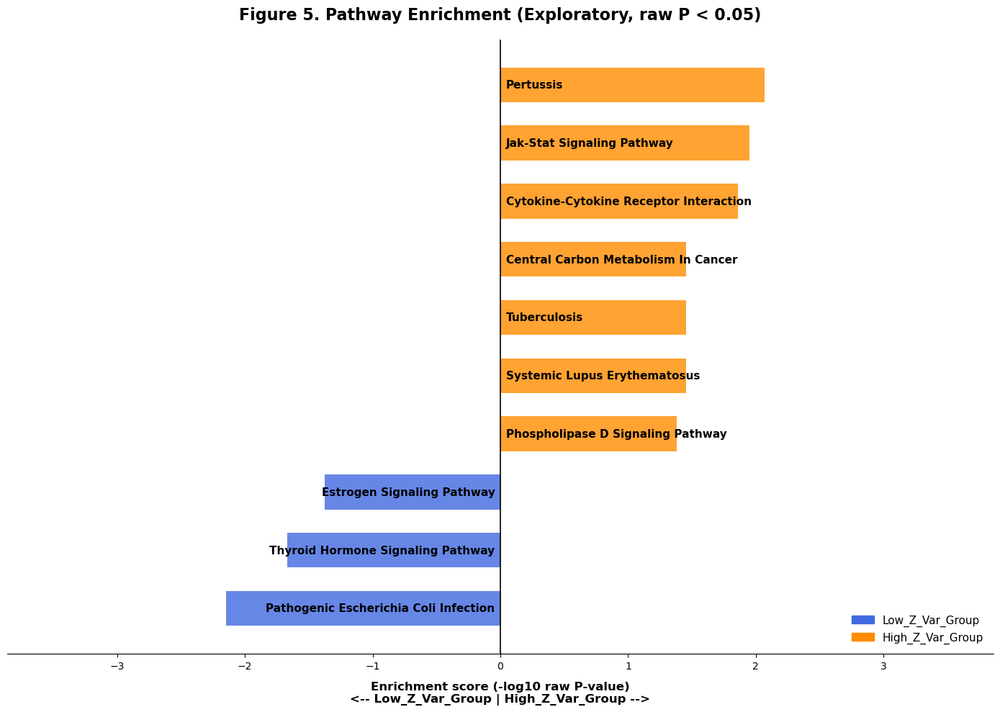

Top terms (High_Z_Var_Group):
                                  Term  P-value  Adjusted P-value  Odds Ratio  Combined Score
                             Pertussis 0.008520          0.647637         inf             inf
            JAK-STAT signaling pathway 0.011169          0.647637    4.991379       22.434194
Cytokine-cytokine receptor interaction 0.013766          0.647637    3.133929       13.430513
          Systemic lupus erythematosus 0.034943          0.647637    8.125000       27.251462
                          Tuberculosis 0.034943          0.647637    8.125000       27.251462
-----------------------------------------------------------------
Top terms (Low_Z_Var_Group):
                                 Term  P-value  Adjusted P-value  Odds Ratio  Combined Score
Pathogenic Escherichia coli infection 0.007164           0.75225    8.178571       40.391895
    Thyroid hormone signaling pathway 0.021511           0.75225         inf             inf
           Estrogen signaling pa

In [32]:
# ===========================================================================
# Part 8: Pathway Enrichment Analysis (Exploratory / Relaxed Thresholds)
# ===========================================================================

import re

import gseapy as gp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ---------------------------------------------------------------------------
# 8.1 Input gene sets (exploratory settings)
# ---------------------------------------------------------------------------
# Note: thresholds here are relaxed for exploratory enrichment and are not the
# same as the "practical marker" thresholds used for reporting in Part 6.
FC_THRESH_EXP = 0.3
Q_THRESH_EXP = 0.05
MEAN_CPM_THRESH_EXP = 10.0

required_cols = {"qval", "log2FC", "Mean_CPM"}
missing = required_cols - set(dge_results.columns)
if missing:
    raise ValueError(f"`dge_results` missing required columns: {sorted(missing)}")

sig_genes = dge_results.loc[
    (dge_results["qval"] < Q_THRESH_EXP)
    & (dge_results["log2FC"].abs() >= FC_THRESH_EXP)
    & (dge_results["Mean_CPM"] >= MEAN_CPM_THRESH_EXP)
].copy()

# Direction by sign of log2FC (High_Z_Var_Group vs Low_Z_Var_Group).
high_z_genes = sig_genes.index[sig_genes["log2FC"] > 0].tolist()
low_z_genes = sig_genes.index[sig_genes["log2FC"] < 0].tolist()

# Use all tested genes as background (panel-limited background).
background_genes = dge_results.index.tolist()

print("=" * 65)
print("Pathway Enrichment Input Summary (Exploratory Settings)")
print("=" * 65)
print(f"Background genes (tested)     : {len(background_genes)}")
print(f"High_Z_Var_Group input genes  : {len(high_z_genes)}")
print(f"Low_Z_Var_Group input genes   : {len(low_z_genes)}")
print(f"Thresholds (exploratory)      : q < {Q_THRESH_EXP}, |log2FC| >= {FC_THRESH_EXP}, Mean_CPM >= {MEAN_CPM_THRESH_EXP}")
print("-" * 65)

# ---------------------------------------------------------------------------
# 8.2 Enrichment (over-representation / hypergeometric test)
# ---------------------------------------------------------------------------
libraries = ["MSigDB_Hallmark_2020", "GO_Biological_Process_2023", "KEGG_2021_Human"]

enr_high = None
enr_low = None

try:
    if high_z_genes:
        print("Running enrichment for High_Z_Var_Group...")
        enr_high = gp.enrich(
            gene_list=high_z_genes,
            gene_sets=libraries,
            background=background_genes,
            outdir=None,
        )
    else:
        print("Skip High_Z_Var_Group enrichment: no input genes.")

    if low_z_genes:
        print("Running enrichment for Low_Z_Var_Group...")
        enr_low = gp.enrich(
            gene_list=low_z_genes,
            gene_sets=libraries,
            background=background_genes,
            outdir=None,
        )
    else:
        print("Skip Low_Z_Var_Group enrichment: no input genes.")

    print("Enrichment complete.")
except Exception as e:
    print(f"Error running gseapy enrichment: {e}")
    enr_high = None
    enr_low = None

# ---------------------------------------------------------------------------
# 8.3 Result processing (display-oriented)
# ---------------------------------------------------------------------------
RAW_P_DISPLAY_CUTOFF = 0.05
TOP_N_TERMS = 15

def process_enrichment(enr_res, label, color, top_n=TOP_N_TERMS):
    if enr_res is None or getattr(enr_res, "results", None) is None or enr_res.results.empty:
        return pd.DataFrame()

    res = enr_res.results.copy()
    res = res.drop_duplicates(subset=["Term"]).copy()

    if "P-value" not in res.columns:
        return pd.DataFrame()

    res["P-value"] = pd.to_numeric(res["P-value"], errors="coerce")
    res = res.loc[res["P-value"].notna()].copy()

    # Exploratory display filter (raw P-value).
    res = res.loc[res["P-value"] < RAW_P_DISPLAY_CUTOFF].copy()
    if res.empty:
        return pd.DataFrame()

    res["score_rawp"] = -np.log10(res["P-value"] + 1e-10)
    res["group"] = label
    res["color"] = color

    return res.sort_values("score_rawp", ascending=False).head(top_n)

def format_enrichment_table(df, top_n=5):
    if df.empty:
        return "None found under current display filter."

    preferred_cols = ["Term", "P-value", "Adjusted P-value", "Overlap", "Odds Ratio", "Combined Score"]
    cols = [c for c in preferred_cols if c in df.columns]
    return df[cols].head(top_n).to_string(index=False) if cols else df.head(top_n).to_string(index=False)

df_high = process_enrichment(enr_high, "High_Z_Var_Group", "darkorange")
df_low = process_enrichment(enr_low, "Low_Z_Var_Group", "royalblue")

if df_high.empty and df_low.empty:
    print("No terms passed the raw P-value display cutoff under the current settings.")
else:
    # -----------------------------------------------------------------------
    # 8.4 Visualization: diverging bar chart (raw P-value score)
    # -----------------------------------------------------------------------
    plot_df = pd.concat([df_low, df_high], ignore_index=True)

    plot_df["plot_score"] = np.where(
        plot_df["group"] == "Low_Z_Var_Group",
        -plot_df["score_rawp"],
        plot_df["score_rawp"],
    )

    plot_df = plot_df.sort_values("plot_score").reset_index(drop=True)

    fig, ax = plt.subplots(figsize=(14, 10))
    y_positions = np.arange(len(plot_df))
    ax.barh(y_positions, plot_df["plot_score"], color=plot_df["color"], alpha=0.8, height=0.6)
    ax.axvline(0, color="black", linewidth=1.2, zorder=3)

    max_abs = float(plot_df["score_rawp"].max())
    text_offset = max_abs * 0.02 if np.isfinite(max_abs) and max_abs > 0 else 0.1
    ax.set_xlim(-max_abs * 1.8, max_abs * 1.8)

    def clean_term_for_display(term: str) -> str:
        t = str(term)
        t = re.sub(r"\s*\(GO:\d+\)", "", t)
        t = re.sub(r"\s*Homo sapiens\s*hsa\d+", "", t)
        t = t.replace("HALLMARK_", "").replace("_", " ").title()
        return (t[:42] + "...") if len(t) > 45 else t

    for i, row in plot_df.iterrows():
        label = clean_term_for_display(row["Term"])
        if row["plot_score"] > 0:
            ax.text(text_offset, i, label, va="center", ha="left", fontsize=11, fontweight="bold", color="black")
        else:
            ax.text(-text_offset, i, label, va="center", ha="right", fontsize=11, fontweight="bold", color="black")

    ax.set_title(
        f"Figure 5. Pathway Enrichment (Exploratory, raw P < {RAW_P_DISPLAY_CUTOFF})",
        fontsize=16,
        fontweight="bold",
        pad=20,
    )
    ax.set_xlabel(
        "Enrichment score (-log10 raw P-value)\n<-- Low_Z_Var_Group | High_Z_Var_Group -->",
        fontsize=12,
        fontweight="bold",
        labelpad=10,
    )

    ax.set_yticks([])
    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        handles=[
            mpatches.Patch(color="royalblue", label="Low_Z_Var_Group"),
            mpatches.Patch(color="darkorange", label="High_Z_Var_Group"),
        ],
        loc="lower right",
        frameon=False,
        fontsize=11,
    )

    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------------
    # 8.5 Text output
    # -----------------------------------------------------------------------
    print("=" * 65)
    print("Top terms (High_Z_Var_Group):")
    print(format_enrichment_table(df_high, top_n=5))
    print("-" * 65)
    print("Top terms (Low_Z_Var_Group):")
    print(format_enrichment_table(df_low, top_n=5))
    print("=" * 65)

# Part 9: Spatial Mapping of Cell-Type Associated Expression Patterns
# 第九部分：细胞类型相关表达模式的空间映射

## 1. Methodological Considerations
## 1. 方法学考量
To characterize spatial context without relying on single-cell segmentation, we evaluated grid-level marker-group scores derived from predefined gene sets. These scores do not assign individual cells or estimate cell counts; instead, they summarize relative expression of cell-type-associated (or program-associated) marker sets within each 20 µm grid. This approach is intended to provide a complementary, segmentation-free view of tissue organization that can be compared with the geometry-defined clusters.

为在不依赖单细胞分割的情况下刻画空间语境，我们基于预先定义的基因集计算了网格级的标记组得分。这些得分不用于分配单个细胞，也不用于估计细胞数量；相反，它们用于汇总每个 20 µm 网格内与细胞类型相关（或与转录程序相关）的标记基因集合的相对表达水平。该方法旨在提供一种分割无关的补充视角，用于与几何定义的聚类结果进行对照。

## 2. Marker-Group Differences Ranked by Effect Size
## 2. 按效应量排序的标记组差异
We compared marker-group scores between the two main geometry-defined groups (Figure 6) and ranked marker groups by Cohen’s d. Under the score definition used here (log1p of the mean CPM across genes in each marker group), positive d indicates higher scores in the High Z-Var group, whereas negative d indicates higher scores in the Low Z-Var group. In this dataset, marker groups labeled as Fibroblasts (d = 1.23), Macrophages (d = 0.66), and T cells (d = 0.20) show higher scores in the High Z-Var group. Marker groups labeled as Breast glandular cells (d = -1.05), Breast myoepithelial cells (d = -0.60), and Breast cancer (d = -0.58) show higher scores in the Low Z-Var group. These results provide a compact summary of which predefined gene sets differ most strongly between the two groups.

我们比较了两类主要几何定义组之间的标记组得分（图 6），并按 Cohen’s d 效应量对标记组进行排序。在本节的得分定义下（对每个标记组基因的平均 CPM 取 log1p），d 为正表示高 Z-Var 组得分更高，d 为负表示低 Z-Var 组得分更高。在该数据集中，标记为成纤维细胞（d = 1.23）、巨噬细胞（d = 0.66）与 T 细胞（d = 0.20）的基因集在高 Z-Var 组得分更高；标记为乳腺腺体细胞（d = -1.05）、乳腺肌上皮细胞（d = -0.60）与乳腺癌（d = -0.58）的基因集在低 Z-Var 组得分更高。这些结果为两组之间差异最大的预定义基因集提供了一个紧凑的汇总视图。

## 3. Integration With Geometry and Molecular Results
## 3. 与几何与分子结果的整合
Together with the DGE and enrichment analyses, these marker-group score patterns are consistent with the interpretation that the geometry-defined groups capture distinct transcriptional contexts. Importantly, the marker-group analysis is supportive rather than definitive: the scores reflect gene-set expression within spatial bins and can be influenced by multiple factors (e.g., mixed cell populations within a grid and differences in total transcript counts). In subsequent sections, we therefore treat these results as complementary evidence and evaluate them alongside other spatial and molecular summaries.

结合差异表达与富集分析，这些标记组得分的空间模式与“几何定义组对应不同转录语境”的解释相一致。需要强调的是，标记组分析属于支持性证据而非决定性证据：得分反映的是空间网格内的基因集表达汇总，可能受到多种因素影响（例如网格内细胞混合，以及总转录本数差异等）。因此在后续章节中，我们将这些结果作为补充证据，并与其他空间与分子层面的摘要指标共同评估。

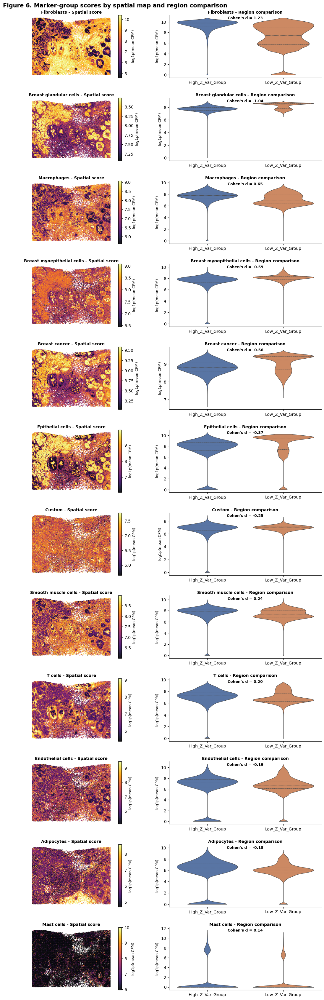

Marker-group score comparison summary (grid-level)
Regions compared: High_Z_Var_Group vs Low_Z_Var_Group
Score scale: log1p(mean CPM across genes within each marker group)
--------------------------------------------------------------------------------
              marker_group   n_a   n_b   mean_a   mean_b  median_a  median_b  cohens_d      pval_mwu      qval_mwu
               Fibroblasts 44525 43636 9.403478 7.084458  9.627570  7.466725  1.226177  0.000000e+00  0.000000e+00
    Breast glandular cells 44525 43636 7.750171 8.198044  7.757418  8.411933 -1.041880  0.000000e+00  0.000000e+00
               Macrophages 44525 43636 7.722178 7.110517  7.778687  6.981793  0.653577  0.000000e+00  0.000000e+00
Breast myoepithelial cells 44525 43636 7.541308 8.096610  7.740599  8.120759 -0.593393  0.000000e+00  0.000000e+00
             Breast cancer 44525 43636 8.822178 9.054078  8.829058  9.244762 -0.563366  0.000000e+00  0.000000e+00
          Epithelial cells 44525 43636 7.339008 8.253636 

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
from scipy import stats
from statsmodels.stats.multitest import multipletests

# ---------------------------------------------------------------------------
# Figure 6: Marker-group scores (spatial maps + region comparison)
# ---------------------------------------------------------------------------
# Score definition:
# For each marker group, score(grid) = log1p( mean CPM across genes in that group )
#
# Notes:
# - Scores quantify grid-level enrichment and do not represent single-cell assignments.
# - This block reuses existing objects when available (grid_matrix, grid_cpm, grid_pd).

warnings.filterwarnings("ignore")

# -----------------------
# 0) Parameters
# -----------------------
TOP_N_GROUPS_TO_PLOT = 12
PLOT_DPI = None  # set e.g. 150 if needed

# Prefer BIN_SIZE_UM if defined
BIN_SIZE_UM = float(globals().get("BIN_SIZE_UM", globals().get("BIN_SIZE", 20.0)))

# -----------------------
# 1) Helpers
# -----------------------
def cohens_d(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if len(a) < 2 or len(b) < 2:
        return np.nan
    va = np.var(a, ddof=1)
    vb = np.var(b, ddof=1)
    denom_df = len(a) + len(b) - 2
    if denom_df <= 0:
        return np.nan
    pooled = np.sqrt(((len(a) - 1) * va + (len(b) - 1) * vb) / denom_df)
    if pooled == 0 or not np.isfinite(pooled):
        return np.nan
    return float((a.mean() - b.mean()) / pooled)

def _ensure_grid_cpm():
    # grid_cpm: index is grid (x_bin, y_bin, optional dge_group); columns are genes
    if "grid_cpm" in globals():
        return globals()["grid_cpm"]

    if "grid_matrix" in globals():
        lib = grid_matrix.sum(axis=1)
        out = grid_matrix.div(lib.replace(0, np.nan), axis=0).fillna(0) * 1e6
        globals()["grid_cpm"] = out
        return out

    raise NameError("Missing `grid_cpm` and `grid_matrix`. Run Part 6 first (or build grid matrix).")

def _ensure_score_tables():
    # Builds score_df_filtered and effect_df if missing.
    if "score_df_filtered" in globals() and "effect_df" in globals():
        return globals()["score_df_filtered"], globals()["effect_df"]

    grid_cpm_local = _ensure_grid_cpm()

    marker_df = pd.read_csv(MARKER_CSV).dropna(subset=["gene", "group"])

    score_dict = {}
    for grp, genes in marker_df.groupby("group")["gene"]:
        keep = [g for g in genes.unique() if g in grid_cpm_local.columns]
        if len(keep) >= 2:
            score_dict[grp] = np.log1p(grid_cpm_local[keep].mean(axis=1))

    if not score_dict:
        raise ValueError("No marker groups could be scored (no sufficient gene overlap with grid CPM matrix).")

    score_mat = pd.DataFrame(score_dict, index=grid_cpm_local.index)

    # Recover region labels per grid
    idx_df = score_mat.index.to_frame(index=False)
    if "dge_group" in idx_df.columns:
        region_series = idx_df["dge_group"].astype(str)
    else:
        if "grid_pd" not in globals() or "region" not in grid_pd.columns:
            raise NameError("Missing `grid_pd['region']`; run Part 5 first.")
        region_map = grid_pd[["x_bin", "y_bin", "region"]].drop_duplicates(["x_bin", "y_bin"])
        idx_df = idx_df.merge(region_map, on=["x_bin", "y_bin"], how="left")
        region_series = idx_df["region"].astype(str)

    # Recover coordinates per grid
    # Support both naming conventions from cleaned Part 4.
    x_col = "x_um" if "x_um" in grid_pd.columns else "x_phys"
    y_col = "y_um" if "y_um" in grid_pd.columns else "y_phys"
    coord_map = grid_pd[["x_bin", "y_bin", x_col, y_col]].drop_duplicates(["x_bin", "y_bin"])

    score_df = idx_df[["x_bin", "y_bin"]].merge(coord_map, on=["x_bin", "y_bin"], how="left")
    score_df["region"] = region_series.values

    score_df = pd.concat([score_df.reset_index(drop=True), score_mat.reset_index(drop=True)], axis=1)

    score_df_filtered_local = score_df.dropna(subset=["region", x_col, y_col]).copy()

    # Choose two regions for effect size comparison.
    all_regions = score_df_filtered_local["region"].dropna().unique().tolist()
    if {"High_Z_Var_Group", "Low_Z_Var_Group"}.issubset(all_regions):
        region_a, region_b = "High_Z_Var_Group", "Low_Z_Var_Group"
    elif {"Cluster 1", "Cluster 2"}.issubset(all_regions):
        region_a, region_b = "Cluster 1", "Cluster 2"
    elif len(all_regions) >= 2:
        region_a, region_b = sorted(all_regions)[:2]
    else:
        raise ValueError(f"Not enough regions for effect size calculation: {all_regions}")

    meta_cols = {"x_bin", "y_bin", x_col, y_col, "region"}
    marker_group_cols = [
        c for c in score_df_filtered_local.columns
        if c not in meta_cols and pd.api.types.is_numeric_dtype(score_df_filtered_local[c])
    ]

    sub = score_df_filtered_local.loc[score_df_filtered_local["region"].isin([region_a, region_b])].copy()
    rows = []
    for grp in marker_group_cols:
        rows.append(
            {
                "marker_group": grp,
                "cohens_d": cohens_d(
                    sub.loc[sub["region"] == region_a, grp],
                    sub.loc[sub["region"] == region_b, grp],
                ),
            }
        )

    effect_df_local = pd.DataFrame(rows).dropna(subset=["cohens_d"])

    globals()["score_df_filtered"] = score_df_filtered_local
    globals()["effect_df"] = effect_df_local

    return score_df_filtered_local, effect_df_local

# -----------------------
# 2) Build / reuse score tables
# -----------------------
score_df_filtered, effect_df = _ensure_score_tables()

# Coordinate column names (after harmonization)
x_col = "x_um" if "x_um" in score_df_filtered.columns else "x_phys"
y_col = "y_um" if "y_um" in score_df_filtered.columns else "y_phys"

# Determine comparison regions (reuse the same logic as effect_df build)
all_regions = score_df_filtered["region"].dropna().unique().tolist()
if {"High_Z_Var_Group", "Low_Z_Var_Group"}.issubset(all_regions):
    region_a, region_b = "High_Z_Var_Group", "Low_Z_Var_Group"
elif {"Cluster 1", "Cluster 2"}.issubset(all_regions):
    region_a, region_b = "Cluster 1", "Cluster 2"
else:
    region_a, region_b = sorted(all_regions)[:2]

# Select top marker groups by |d|
sorted_groups = (
    effect_df.assign(abs_d=effect_df["cohens_d"].abs())
    .sort_values("abs_d", ascending=False)["marker_group"]
    .head(TOP_N_GROUPS_TO_PLOT)
    .tolist()
)
d_map = dict(zip(effect_df["marker_group"], effect_df["cohens_d"]))

if not sorted_groups:
    raise ValueError("No marker groups available for plotting.")

plot_regions = sorted(score_df_filtered["region"].dropna().unique().tolist())
vio_df = score_df_filtered.loc[score_df_filtered["region"].isin(plot_regions)].copy()
palette_violin = dict(zip(plot_regions, sns.color_palette("deep", n_colors=len(plot_regions))))

# -----------------------
# 3) Plot: spatial score map + violin by region
# -----------------------
n = len(sorted_groups)
fig, axes = plt.subplots(
    nrows=n,
    ncols=2,
    figsize=(14, max(8, n * 2.8)),
    constrained_layout=True,
    gridspec_kw={"width_ratios": [1.35, 1.0]},
    dpi=PLOT_DPI,
)
if n == 1:
    axes = np.array([axes])

for i, grp in enumerate(sorted_groups):
    ax_map = axes[i, 0]
    ax_vio = axes[i, 1]

    vals = score_df_filtered[grp].to_numpy(dtype=float)
    finite_pos = vals[np.isfinite(vals) & (vals > 0)]
    if finite_pos.size >= 2:
        vmin, vmax = np.percentile(finite_pos, [2, 98])
        if vmin == vmax:
            vmax = vmin + 1e-9
    else:
        vmin, vmax = 0.0, 1.0

    sc = ax_map.scatter(
        score_df_filtered[x_col],
        score_df_filtered[y_col],
        c=score_df_filtered[grp],
        s=0.8,
        cmap="inferno",
        alpha=0.9,
        edgecolors="none",
        vmin=vmin,
        vmax=vmax,
        rasterized=True,
    )
    ax_map.set_title(f"{grp} - Spatial score", fontsize=10, fontweight="bold", pad=4)
    ax_map.set_aspect("equal")
    ax_map.invert_yaxis()
    ax_map.set_xticks([])
    ax_map.set_yticks([])
    for spine in ["top", "right", "left", "bottom"]:
        ax_map.spines[spine].set_visible(False)

    cbar = fig.colorbar(sc, ax=ax_map, fraction=0.046, pad=0.02)
    cbar.set_label("log1p(mean CPM)", fontsize=9)

    sns.violinplot(
        data=vio_df,
        x="region",
        y=grp,
        hue="region",
        order=plot_regions,
        palette=palette_violin,
        inner="quartile",
        cut=0,
        linewidth=0.8,
        dodge=False,
        ax=ax_vio,
    )
    if ax_vio.legend_ is not None:
        ax_vio.legend_.remove()

    ax_vio.set_title(f"{grp} - Region comparison", fontsize=10, fontweight="bold", pad=4)
    ax_vio.set_xlabel("")
    ax_vio.set_ylabel("log1p(mean CPM)", fontsize=9)
    for spine in ["top", "right"]:
        ax_vio.spines[spine].set_visible(False)

    d_value = d_map.get(grp, np.nan)
    if np.isfinite(d_value):
        ax_vio.text(
            0.5,
            0.98,
            f"Cohen's d = {d_value:.2f}",
            transform=ax_vio.transAxes,
            ha="center",
            va="top",
            fontsize=9,
            fontweight="bold",
            color="black",
        )

fig.suptitle(
    "Figure 6. Marker-group scores by spatial map and region comparison",
    fontsize=14,
    fontweight="bold",
)
fig.set_constrained_layout_pads(w_pad=2 / 72, h_pad=2 / 72, hspace=0.10, wspace=0.08)
plt.show()

# -----------------------
# 4) Extra: statistical summary table
# -----------------------
meta_cols = {"x_bin", "y_bin", x_col, y_col, "region"}
marker_group_cols = [
    c for c in score_df_filtered.columns
    if c not in meta_cols and pd.api.types.is_numeric_dtype(score_df_filtered[c])
]
sub = score_df_filtered.loc[score_df_filtered["region"].isin([region_a, region_b])].copy()

rows = []
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for grp in marker_group_cols:
        a = sub.loc[sub["region"] == region_a, grp].to_numpy(dtype=float)
        b = sub.loc[sub["region"] == region_b, grp].to_numpy(dtype=float)
        a = a[np.isfinite(a)]
        b = b[np.isfinite(b)]

        if len(a) >= 2 and len(b) >= 2 and (np.var(a) > 0 or np.var(b) > 0):
            _, p = stats.mannwhitneyu(a, b, alternative="two-sided")
            p = float(p) if np.isfinite(p) else np.nan
        else:
            p = np.nan

        rows.append(
            {
                "marker_group": grp,
                "region_a": region_a,
                "region_b": region_b,
                "n_a": int(len(a)),
                "n_b": int(len(b)),
                "mean_a": float(np.mean(a)) if len(a) else np.nan,
                "mean_b": float(np.mean(b)) if len(b) else np.nan,
                "median_a": float(np.median(a)) if len(a) else np.nan,
                "median_b": float(np.median(b)) if len(b) else np.nan,
                "cohens_d": cohens_d(a, b),  # (a - b) / pooled_sd
                "pval_mwu": p,
            }
        )

stats_table = pd.DataFrame(rows)

# BH-FDR across marker groups
pvals = stats_table["pval_mwu"].fillna(1.0).to_numpy(dtype=float)
_, qvals, _, _ = multipletests(pvals, method="fdr_bh")
stats_table["qval_mwu"] = qvals
stats_table["neglog10_qval_mwu"] = -np.log10(stats_table["qval_mwu"] + 1e-300)

stats_table = (
    stats_table.assign(abs_d=stats_table["cohens_d"].abs())
    .sort_values("abs_d", ascending=False)
    .drop(columns=["abs_d"])
    .reset_index(drop=True)
)

TOP_PRINT = 30
print("=" * 80)
print("Marker-group score comparison summary (grid-level)")
print("=" * 80)
print(f"Regions compared: {region_a} vs {region_b}")
print("Score scale: log1p(mean CPM across genes within each marker group)")
print("-" * 80)
print(
    stats_table[
        [
            "marker_group",
            "n_a",
            "n_b",
            "mean_a",
            "mean_b",
            "median_a",
            "median_b",
            "cohens_d",
            "pval_mwu",
            "qval_mwu",
        ]
    ]
    .head(TOP_PRINT)
    .to_string(index=False)
)
print("=" * 80)

# Keep for downstream use if needed
effect_stats_table = stats_table

# Part 10: Spatial Neighborhood Analysis and Associations With 3D Z Dispersion
# 第十部分：空间邻域分析与 3D Z 离散度的关联

## 1. Local Neighborhood Definition via KD-Tree
## 1. 基于 KD-Tree 的局部邻域定义
To quantify local spatial context around each grid without requiring cell segmentation, we constructed a neighborhood graph using a KD-tree on grid centroids. For each grid, we queried neighbors within a fixed radius of 50 µm (approximately a few cell diameters at this grid size) and computed two neighborhood summaries:
1. Neighbor density: the number of neighboring grids per unit area within the search radius, as a grid-level proxy for local crowding.
2. Heterogeneity index (hard): the fraction of neighbors whose dominant marker-group label differs from the focal grid, where the dominant label is defined as the marker group with the highest score in that grid. This index summarizes local mixing under a discrete, marker-group-derived labeling scheme.

为在不依赖细胞分割的情况下量化每个网格周围的局部空间语境，我们基于网格中心点构建 KD-tree 邻域结构。对每个网格，我们在固定的 50 µm 半径内查询邻居（在当前网格尺度下约相当于数个细胞直径），并计算两个邻域摘要指标：
1. 邻域密度：在搜索半径内单位面积的邻域网格数，作为局部拥挤程度的网格级代理指标。
2. 异质性指数（硬定义）：邻域内“主导标记组标签”与当前网格不同的比例。其中主导标签定义为该网格内得分最高的标记组。该指标在离散的、由标记组得分派生的标注方案下，对局部混合程度进行汇总。

## 2. Associations Between Z-Stacking Index and Neighborhood Density
## 2. Z-Stacking Index 与邻域密度的关联
We assessed the relationship between within-grid Z dispersion (Z-Stacking Index) and neighborhood density using Spearman correlation within each geometry-defined region. In this dataset, the correlation is positive in Cluster 1 (ρ = 0.217) and negative in Cluster 2 (ρ = −0.100), with very small p-values under the current sample sizes. These results indicate that the direction of association between local crowding and Z dispersion differs between the two regions. Because the analysis is correlational and based on grid-level proxies, these patterns are interpreted as associations rather than as direct evidence of a specific physical mechanism.

我们在每个几何定义区域内，使用 Spearman 相关性评估网格内 Z 离散度（Z-Stacking Index）与邻域密度之间的关系。在该数据集中，Cluster 1 中二者呈正相关（ρ = 0.217），而 Cluster 2 中呈负相关（ρ = −0.100），在当前样本量下 p 值非常小。这些结果表明：局部拥挤程度与 Z 离散度之间的关联方向在两个区域内不同。由于该分析为相关性分析且使用网格级代理指标，因此这些模式在此处解释为统计关联，而非对具体物理机制的直接证明。

## 3. Associations Between Z-Stacking Index and Local Mixing
## 3. Z-Stacking Index 与局部混合度的关联
We further evaluated whether local mixing (as summarized by the hard heterogeneity index) is associated with Z dispersion. In this dataset, within Cluster 2, higher heterogeneity is associated with higher Z-Stacking Index (ρ = 0.154 under the hard definition). This observation suggests that grids located in more mixed local contexts tend to show greater within-grid Z dispersion. One practical interpretation is that such grids may be more likely to occur near boundaries between spatial domains; however, boundary localization requires explicit distance-to-interface modeling, which is addressed in subsequent sections.

我们进一步评估了局部混合度（以硬定义异质性指数表示）与 Z 离散度之间的关联。在该数据集中，Cluster 2 内部，异质性更高的网格倾向于具有更高的 Z-Stacking Index（在硬定义下 ρ = 0.154）。这一观察提示：处于更“混合”局部语境中的网格，往往具有更大的网格内 Z 离散度。一个实用的解释是，这类网格可能更常出现在不同空间区域的交界附近；但对“边界位置”的检验需要显式的界面距离建模，相关分析将在后续章节展开。

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from scipy import stats

# ---------------------------------------------------------------------------
# Neighborhood metrics + correlations (marker-group-derived, grid-level)
# ---------------------------------------------------------------------------
# This block computes:
# - neighbor_density: number of neighboring populated grids per unit area
# - heterogeneity_index_hard: fraction of neighbors with a different dominant marker group
# and reports Spearman correlations with within-grid Z dispersion (Z-Stacking Index)
# within each region.
#
# Dominant marker group is defined as argmax over marker-group scores per grid
# and is used as a discrete label for a simple heterogeneity summary.

# -----------------------
# 0) Resolve naming conventions
# -----------------------
if "grid_pd" not in globals():
    raise NameError("Missing `grid_pd`; run grid aggregation and clustering first.")

x_col = "x_um" if "x_um" in grid_pd.columns else "x_phys"
y_col = "y_um" if "y_um" in grid_pd.columns else "y_phys"
z_col = "z_stacking_index_um" if "z_stacking_index_um" in grid_pd.columns else "z_stacking_index"

required_grid_cols = {x_col, y_col, z_col, "region"}
missing = required_grid_cols - set(grid_pd.columns)
if missing:
    raise ValueError(f"`grid_pd` missing required columns: {sorted(missing)}")

# Prefer score_df_filtered to avoid missing coords/regions.
if "score_df_filtered" not in globals():
    raise NameError("Missing `score_df_filtered`; run marker-group scoring block first.")

score_exclude = {x_col, y_col, "x_bin", "y_bin", "region"}
marker_group_cols = [
    c for c in score_df_filtered.columns
    if c not in score_exclude and pd.api.types.is_numeric_dtype(score_df_filtered[c])
]
if not marker_group_cols:
    raise ValueError("No numeric marker-group score columns found in `score_df_filtered`.")

# -----------------------
# 1) Build base table: grid metrics + marker-group scores
# -----------------------
base = grid_pd[[x_col, y_col, z_col, "region"]].merge(
    score_df_filtered[[x_col, y_col] + marker_group_cols],
    on=[x_col, y_col],
    how="inner",
)

# Dominant marker group per grid (hard label for heterogeneity summary).
base["dominant_marker_group"] = base[marker_group_cols].idxmax(axis=1)

# -----------------------
# 2) Neighborhood metrics via KDTree
# -----------------------
RADIUS_UM = 50.0

coords = base[[x_col, y_col]].to_numpy(dtype=float)
tree = cKDTree(coords)
neighbor_lists = tree.query_ball_point(coords, r=RADIUS_UM)

area_um2 = float(np.pi * (RADIUS_UM  2))
dominant = base["dominant_marker_group"].to_numpy()

neighbor_count = np.empty(len(base), dtype=np.int32)
neighbor_density_per_um2 = np.empty(len(base), dtype=float)
heterogeneity_index_hard = np.empty(len(base), dtype=float)

for i, nbrs in enumerate(neighbor_lists):
    nbrs = [j for j in nbrs if j != i]
    k = len(nbrs)

    neighbor_count[i] = k
    neighbor_density_per_um2[i] = k / area_um2

    if k == 0:
        heterogeneity_index_hard[i] = np.nan
    else:
        heterogeneity_index_hard[i] = float(np.mean(dominant[nbrs] != dominant[i]))

base["neighbor_count"] = neighbor_count
base["neighbor_density_per_um2"] = neighbor_density_per_um2
base["heterogeneity_index_hard"] = heterogeneity_index_hard

# -----------------------
# 3) Group-wise Spearman correlation
# -----------------------
def spearman_report(df: pd.DataFrame, x: str, y: str, min_samples: int = 20):
    sub = df[[x, y]].dropna()
    n = int(len(sub))
    if n < min_samples:
        return np.nan, np.nan, n
    rho, p = stats.spearmanr(sub[x].to_numpy(dtype=float), sub[y].to_numpy(dtype=float))
    return float(rho), float(p), n

def _p_to_str(p: float) -> str:
    if not np.isfinite(p):
        return "nan"
    if p == 0.0:
        # Underflow in floating-point representation.
        return "< 1e-300"
    return f"{p:.2e}"

for region_name in sorted(base["region"].dropna().unique()):
    sub = base.loc[base["region"] == region_name]

    rho_den, p_den, n_den = spearman_report(sub, z_col, "neighbor_density_per_um2")
    rho_het, p_het, n_het = spearman_report(sub, z_col, "heterogeneity_index_hard")

    print(f"{region_name}:")
    print(f"  {z_col} vs neighbor_density_per_um2 : rho={rho_den:.3f}, p={_p_to_str(p_den)}, n={n_den}")
    print(f"  {z_col} vs heterogeneity_index_hard : rho={rho_het:.3f}, p={_p_to_str(p_het)}, n={n_het}")

Cluster 0:
  z_stacking_index_um vs neighbor_density_per_um2 : rho=nan, p=nan, n=1
  z_stacking_index_um vs heterogeneity_index_hard : rho=nan, p=nan, n=1
Cluster 1:
  z_stacking_index_um vs neighbor_density_per_um2 : rho=0.219, p=< 1e-300, n=44132
  z_stacking_index_um vs heterogeneity_index_hard : rho=-0.008, p=1.04e-01, n=44121
Cluster 2:
  z_stacking_index_um vs neighbor_density_per_um2 : rho=-0.101, p=3.25e-99, n=44028
  z_stacking_index_um vs heterogeneity_index_hard : rho=0.152, p=1.45e-225, n=44028


# Part 11: Robustness Analysis and Partial Correlation of Neighborhood Associations
# 第十一部分：邻域关联的稳健性分析与偏相关研究

## 1. Controlling a Library-Size Confounder
## 1. 控制文库大小相关的混杂因素
Building on the neighborhood summaries defined in Part 10, we asked whether the observed associations between neighborhood context and Z-Stacking Index could be driven by variation in transcript count per grid. To address this, we performed a sensitivity sweep over neighborhood radii (40–120 µm) and computed partial Spearman correlations, using log1p(transcript_count) as a covariate. This procedure aims to assess whether associations between Z dispersion and neighborhood metrics persist after adjusting for a grid-level library-size proxy.

基于第十部分定义的邻域摘要指标，我们进一步提出一个方法学问题：邻域语境与 Z-Stacking Index 的关联是否可能主要由每网格转录本数量的差异所驱动。为此，我们在 40–120 µm 的邻域半径范围内进行敏感性扫描，并计算偏 Spearman 相关性，以 log1p(transcript_count) 作为协变量。该过程旨在评估：在对网格级文库大小代理变量进行调整后，Z 离散度与邻域指标之间的关联是否仍然存在。

## 2. Radius Sensitivity of Density–Z and Mixing–Z Associations
## 2. 密度–Z 与混合度–Z 关联的半径敏感性
Across radii, the sign and magnitude of the density–Z association remain region-dependent. In this dataset, Cluster 1 shows a positive Spearman correlation between Z dispersion and neighborhood density, whereas Cluster 2 shows a negative correlation. After controlling for log1p(transcript_count), the partial correlation in Cluster 1 remains positive and relatively stable (approximately 0.16–0.18 over the tested radii), while in Cluster 2 it moves toward zero (approximately 0.01 to slightly negative). These results suggest that the density–Z association in Cluster 2 is more sensitive to transcript count, whereas the association in Cluster 1 persists under this single-covariate adjustment.

For local mixing, we quantified a soft heterogeneity index using the Gini–Simpson formulation based on aggregated marker-group scores in the neighborhood. In Cluster 2, Z dispersion shows a positive association with soft heterogeneity, and the partial correlation remains positive after controlling for transcript count (approximately 0.28 decreasing to ~0.24 as radius increases). In Cluster 1, the corresponding association is smaller (approximately 0.05 decreasing to ~0.03 after adjustment). These patterns provide a quantitative summary of how neighborhood mixing relates to Z dispersion at different spatial scales.

在不同半径下，密度–Z 关联的方向与幅度在不同区域中保持差异性。在该数据集中，Cluster 1 中 Z 离散度与邻域密度呈正的 Spearman 相关，而 Cluster 2 中呈负相关。在控制 log1p(transcript_count) 后，Cluster 1 的偏相关仍保持为正且相对稳定（在测试半径内约 0.16–0.18），而 Cluster 2 的偏相关趋近于零（约 0.01 到略为负值）。这提示：Cluster 2 中密度–Z 的关联对转录本数量更敏感，而 Cluster 1 中的关联在该单一协变量调整下仍可观察到。

对于局部混合度，我们基于邻域内标记组得分的聚合分布，使用 Gini–Simpson 形式定义了软异质性指标。在 Cluster 2 中，Z 离散度与软异质性呈正相关，并且在控制转录本数量后偏相关仍为正（约 0.28 随半径增大下降至约 0.24）。在 Cluster 1 中，相应关联幅度较小（调整后约 0.05 下降至约 0.03）。这些模式为“邻域混合度与 Z 离散度在不同空间尺度上的关系”提供了定量汇总。

## 3. Motivation for Interface-Focused Modeling
## 3. 引出界面聚焦建模
Within Cluster 2, the partial association between Z dispersion and soft heterogeneity decreases as the neighborhood radius increases, indicating that the relationship is stronger at more local scales under the current definitions. One practical interpretation is that Z dispersion may be more elevated in grids located near local transitions between spatial contexts, which would be most evident at short distances. To test this interpretation directly, we next introduce an interface-centric coordinate system based on signed distance to the boundary between major spatial domains and analyze feature gradients across that boundary.

在 Cluster 2 内，Z 离散度与软异质性的偏相关随邻域半径增大而降低，提示在当前指标定义下，该关系在更局部的尺度上更强。一个实用的解释是：Z 离散度可能在空间语境发生局部过渡的位置更高，而这种现象在较短距离尺度上更容易被捕获。为直接检验这一解释，我们将在下一部分引入以界面为中心的坐标体系（到主要空间区室边界的有符号距离），并对跨界面的特征梯度进行分析。

 radius_um    region  rho_z_density  partial_rho_z_density  rho_z_heter_soft  partial_rho_z_heter_soft
        40 Cluster 1       0.218379               0.164761          0.084780                  0.048597
        60 Cluster 1       0.218548               0.173202          0.079889                  0.045513
        80 Cluster 1       0.218689               0.176306          0.076548                  0.043821
       100 Cluster 1       0.215370               0.175160          0.069047                  0.037858
       120 Cluster 1       0.212026               0.172478          0.063951                  0.033667
        40 Cluster 2      -0.090252               0.014140          0.387557                  0.275322
        60 Cluster 2      -0.102651               0.013347          0.372286                  0.263840
        80 Cluster 2      -0.107592               0.008132          0.357839                  0.254039
       100 Cluster 2      -0.108290              -0.001033          0.341

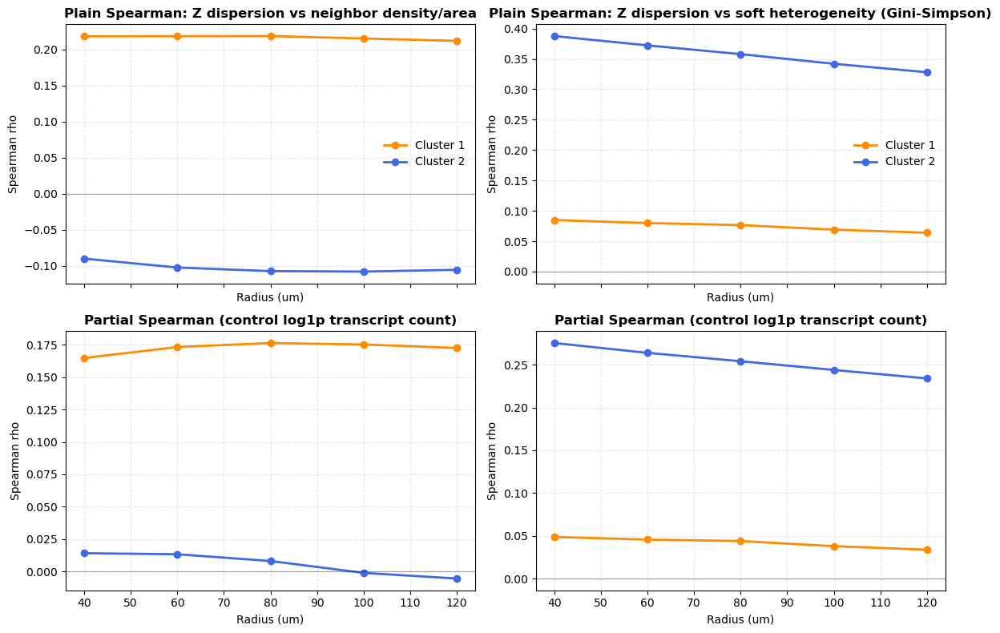

In [35]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from scipy import stats
import matplotlib.pyplot as plt

# ===========================================================================
# Part 11: Sensitivity sweep + partial Spearman (self-contained base rebuild)
# ===========================================================================

# -----------------------
# 0) Validate inputs
# -----------------------
if "grid_pd" not in globals():
    raise NameError("Missing `grid_pd`. Run grid aggregation (Part 4) and clustering (Part 5) first.")
if "score_df_filtered" not in globals():
    raise NameError("Missing `score_df_filtered`. Run marker-group scoring block (Figure 6) first.")

# Resolve coordinate columns (prefer cleaned naming if present)
x_col_gp = "x_um" if "x_um" in grid_pd.columns else "x_phys"
y_col_gp = "y_um" if "y_um" in grid_pd.columns else "y_phys"

# Resolve Z dispersion column (std dev within grid)
z_col_gp = "z_stacking_index_um" if "z_stacking_index_um" in grid_pd.columns else "z_stacking_index"

required_grid = {x_col_gp, y_col_gp, z_col_gp, "region", "transcript_count"}
missing_grid = required_grid - set(grid_pd.columns)
if missing_grid:
    raise ValueError(f"`grid_pd` missing required columns: {sorted(missing_grid)}")

required_score = {x_col_gp, y_col_gp, "region"}
missing_score = required_score - set(score_df_filtered.columns)
if missing_score:
    raise ValueError(f"`score_df_filtered` missing required columns: {sorted(missing_score)}")

# Infer marker-group score columns from score_df_filtered
exclude = {x_col_gp, y_col_gp, "x_bin", "y_bin", "region"}
marker_group_cols = [
    c for c in score_df_filtered.columns
    if c not in exclude and pd.api.types.is_numeric_dtype(score_df_filtered[c])
]
if not marker_group_cols:
    raise ValueError("No numeric marker-group score columns found in `score_df_filtered`.")

# -----------------------
# 1) Rebuild a standardized base table
# -----------------------
# Keep only columns needed for neighborhood metrics and correlations.
base_std = (
    grid_pd[[x_col_gp, y_col_gp, z_col_gp, "transcript_count", "region"]]
    .merge(
        score_df_filtered[[x_col_gp, y_col_gp] + marker_group_cols],
        on=[x_col_gp, y_col_gp],
        how="inner",
    )
    .copy()
)

# Standardize internal names to avoid downstream confusion
base_std = base_std.rename(
    columns={
        x_col_gp: "x_coord",
        y_col_gp: "y_coord",
        z_col_gp: "z_dispersion",
    }
)

# Dominant marker group per grid (hard label)
base_std["dominant_marker_group"] = base_std[marker_group_cols].idxmax(axis=1)

# Determine region order (prefer High/Low, else Cluster 1/2, else first two)
regions_present = sorted(base_std["region"].dropna().unique().tolist())
if {"High_Z_Var_Group", "Low_Z_Var_Group"}.issubset(regions_present):
    region_order = ["High_Z_Var_Group", "Low_Z_Var_Group"]
elif {"Cluster 1", "Cluster 2"}.issubset(regions_present):
    region_order = ["Cluster 1", "Cluster 2"]
else:
    if len(regions_present) < 2:
        raise ValueError(f"Not enough regions for comparison: {regions_present}")
    region_order = regions_present[:2]

color_map = {region_order[0]: "darkorange", region_order[1]: "royalblue"}

coords = base_std[["x_coord", "y_coord"]].to_numpy(dtype=float)
tree = cKDTree(coords)

dominant = base_std["dominant_marker_group"].to_numpy()

scores = base_std[marker_group_cols].to_numpy(dtype=float)
scores = np.clip(scores, 0.0, None)  # score is expected to be non-negative on log1p scale

# -----------------------
# 2) Helpers: Spearman and partial Spearman (rank residualization)
# -----------------------
def _rank(x):
    return stats.rankdata(x, method="average")

def spearman(x, y, min_n: int = 20):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    m = np.isfinite(x) & np.isfinite(y)
    x = x[m]; y = y[m]
    n = int(len(x))
    if n < min_n:
        return np.nan, np.nan, n
    rho, p = stats.spearmanr(x, y)
    return float(rho), float(p), n

def partial_spearman(x, y, covariate, min_n: int = 20):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    c = np.asarray(covariate, dtype=float)
    m = np.isfinite(x) & np.isfinite(y) & np.isfinite(c)
    x = x[m]; y = y[m]; c = c[m]
    n = int(len(x))
    if n < min_n:
        return np.nan, np.nan, n

    rx = _rank(x); ry = _rank(y); rc = _rank(c)
    design = np.column_stack([np.ones(n), rc])

    bx, *_ = np.linalg.lstsq(design, rx, rcond=None)
    by, *_ = np.linalg.lstsq(design, ry, rcond=None)

    res_x = rx - design @ bx
    res_y = ry - design @ by

    rho, p = stats.spearmanr(res_x, res_y)
    return float(rho), float(p), n

# -----------------------
# 3) Neighborhood metrics at a given radius
# -----------------------
def metrics_for_radius(radius_um: float):
    neighbors = tree.query_ball_point(coords, r=float(radius_um))
    area = float(np.pi * (radius_um  2))

    density_per_area = np.empty(len(base_std), dtype=float)
    heter_hard = np.empty(len(base_std), dtype=float)
    heter_soft = np.empty(len(base_std), dtype=float)

    for i, idx in enumerate(neighbors):
        idx = [j for j in idx if j != i]
        k = len(idx)

        density_per_area[i] = k / area

        if k == 0:
            heter_hard[i] = np.nan
            heter_soft[i] = np.nan
            continue

        heter_hard[i] = float(np.mean(dominant[idx] != dominant[i]))

        agg = scores[idx].sum(axis=0)
        total = float(agg.sum())
        if total <= 0:
            heter_soft[i] = np.nan
        else:
            p = agg / total
            heter_soft[i] = float(1.0 - np.sum(p * p))  # Gini-Simpson

    return density_per_area, heter_hard, heter_soft

# -----------------------
# 4) Sensitivity sweep + plots
# -----------------------
radius_values = list(range(40, 121, 20))
covariate = np.log1p(base_std["transcript_count"].to_numpy(dtype=float))

rows = []
for radius in radius_values:
    density, heter_hard, heter_soft = metrics_for_radius(float(radius))

    tmp = base_std[["region", "z_dispersion"]].copy()
    tmp["covariate_log1p_transcripts"] = covariate
    tmp["neighbor_density_per_area"] = density
    tmp["heter_hard"] = heter_hard
    tmp["heter_soft"] = heter_soft

    for reg in region_order:
        sub = tmp.loc[tmp["region"] == reg]

        rho_den, _, _ = spearman(sub["z_dispersion"], sub["neighbor_density_per_area"])
        rho_soft, _, _ = spearman(sub["z_dispersion"], sub["heter_soft"])

        prho_den, _, _ = partial_spearman(sub["z_dispersion"], sub["neighbor_density_per_area"], sub["covariate_log1p_transcripts"])
        prho_soft, _, _ = partial_spearman(sub["z_dispersion"], sub["heter_soft"], sub["covariate_log1p_transcripts"])

        rows.append(
            {
                "radius_um": int(radius),
                "region": reg,
                "rho_z_density": rho_den,
                "partial_rho_z_density": prho_den,
                "rho_z_heter_soft": rho_soft,
                "partial_rho_z_heter_soft": prho_soft,
            }
        )

sens_df = pd.DataFrame(rows).sort_values(["region", "radius_um"]).reset_index(drop=True)

print(
    sens_df[
        ["radius_um", "region", "rho_z_density", "partial_rho_z_density", "rho_z_heter_soft", "partial_rho_z_heter_soft"]
    ].to_string(index=False)
)

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)

for reg in region_order:
    sub = sens_df.loc[sens_df["region"] == reg]
    color = color_map.get(reg, "gray")

    axes[0, 0].plot(sub["radius_um"], sub["rho_z_density"], marker="o", lw=2, color=color, label=reg)
    axes[1, 0].plot(sub["radius_um"], sub["partial_rho_z_density"], marker="o", lw=2, color=color, label=reg)

    axes[0, 1].plot(sub["radius_um"], sub["rho_z_heter_soft"], marker="o", lw=2, color=color, label=reg)
    axes[1, 1].plot(sub["radius_um"], sub["partial_rho_z_heter_soft"], marker="o", lw=2, color=color, label=reg)

for ax in axes.ravel():
    ax.axhline(0, color="black", lw=1, alpha=0.3)
    ax.set_xlabel("Radius (um)")
    ax.set_ylabel("Spearman rho")
    ax.grid(True, ls="--", alpha=0.3)

axes[0, 0].set_title("Plain Spearman: Z dispersion vs neighbor density/area", fontweight="bold")
axes[1, 0].set_title("Partial Spearman (control log1p transcript count)", fontweight="bold")
axes[0, 1].set_title("Plain Spearman: Z dispersion vs soft heterogeneity (Gini-Simpson)", fontweight="bold")
axes[1, 1].set_title("Partial Spearman (control log1p transcript count)", fontweight="bold")

axes[0, 0].legend(frameon=False)
axes[0, 1].legend(frameon=False)

plt.tight_layout()
plt.show()

# Part 12: Spatial Gradient Analysis at the Tumor–Stroma Interface
# 第十二部分：肿瘤–间质交界面的空间梯度分析

## 1. Interface-Centric Coordinate Transformation
## 1. 以界面为中心的坐标变换
To summarize how features change across the boundary between the two major regions, we computed a signed distance for each grid to an operationally defined interface. Negative distances correspond to grids assigned to the negative-label region (Cluster 2 / Low_Z_Var_Group), and positive distances correspond to grids assigned to the positive-label region (Cluster 1 / High_Z_Var_Group). The interface is defined using neighborhood proximity between opposite labels, and the signed distance is computed as the minimum Euclidean distance from each grid centroid to the set of boundary grids. This transformation maps a complex 2D spatial arrangement onto a 1D distance axis to facilitate binned comparisons and gradient-style visualization.

为汇总两类主要区域交界处的特征变化，我们为每个网格计算了到“操作性定义界面”的有符号距离。负距离对应于负标签区域（Cluster 2 / Low_Z_Var_Group）的网格，正距离对应于正标签区域（Cluster 1 / High_Z_Var_Group）的网格。该界面基于相反标签在空间邻近范围内的接触关系进行定义；随后，有符号距离被计算为每个网格中心到边界网格集合的最小欧氏距离。该变换将复杂的二维空间布局映射到一维距离轴，便于进行分箱比较与梯度式可视化。

## 2. Distance-Binned Feature Profiles
## 2. 距离分箱的特征轮廓
We binned grids along the signed-distance axis and summarized feature values within each bin. For visualization, features were optionally standardized per feature (row-wise Z-score) to emphasize relative changes across distance bins (Figure 7). Under this representation, multiple features show their highest or lowest standardized values at different distance ranges. To improve interpretability, we describe these patterns using distance intervals as a descriptive scaffold; the exact bin ranges depend on the selected bin width and boundary definition parameters.

我们沿有符号距离轴对网格进行分箱，并在每个分箱内汇总特征值。为便于可视化，特征可按特征维度进行标准化（逐行 Z-score），以强调不同距离分箱之间的相对变化（图 7）。在这种表示方式下，不同特征在不同距离区间呈现相对高值或低值。为提高可读性，我们使用若干距离区间对这些模式进行描述性概括；具体的分箱边界取决于所选的分箱宽度及界面定义参数。

In this dataset, marker-group scores associated with epithelial programs and grid-level transcript density tend to be higher on the negative-distance side, whereas marker-group scores associated with stromal programs (e.g., fibroblast-associated gene sets) tend to be higher on the positive-distance side. Several immune-associated marker groups show elevated standardized values near distance zero under the current binning, suggesting a boundary-adjacent peak in these scores. These observations motivate a more targeted interface analysis in the next section, where specific features can be profiled with explicit summary statistics and uncertainty.

在该数据集中，与上皮相关的标记组得分以及网格级转录本密度在负距离侧总体更高；与间质相关的标记组得分（例如成纤维细胞相关基因集）在正距离侧总体更高。在当前分箱设置下，若干免疫相关标记组在距离接近 0 的位置呈现更高的标准化值，提示这些得分可能在界面邻近区域达到峰值。上述观察为下一部分更有针对性的界面定量分析提供了动机；在后续分析中，我们将对选定特征给出明确的汇总统计与不确定性描述。

Regions used: negative=Cluster 2, positive=Cluster 1
Total features to plot: 17


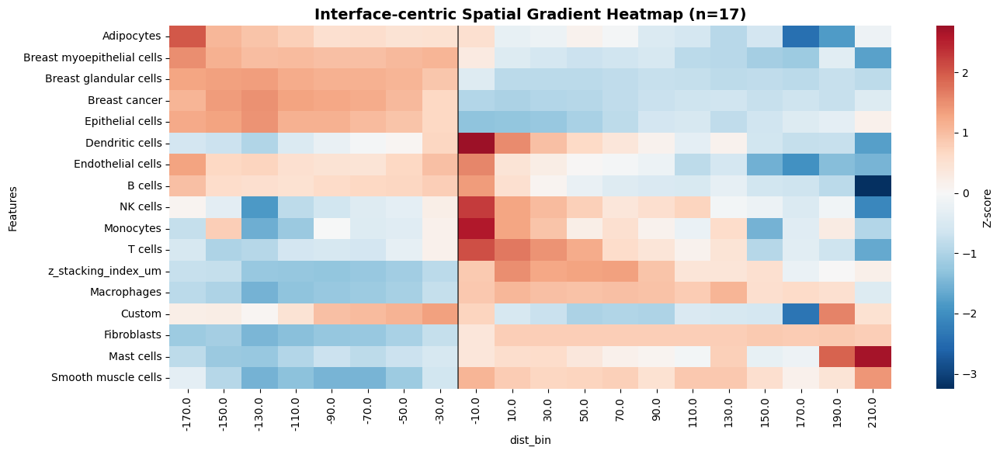

In [36]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
import seaborn as sns
import matplotlib.pyplot as plt

# ============================================================
# 1) Signed distance to region boundary
# ============================================================
def compute_signed_distance_to_boundary(
    base_df: pd.DataFrame,
    negative_label: str,
    positive_label: str,
    x_col: str,
    y_col: str,
    region_col: str = "region",
    boundary_neighbor_radius_um: float = 30.0,
):
    """
    Compute signed distance (um) from each point to the boundary between two labels.

    Boundary definition:
      A point is marked as boundary if it has at least one neighbor (within
      boundary_neighbor_radius_um) that belongs to the opposite label.

    Returns:
      signed_df: base_df filtered to the two labels + columns:
        - signed_dist_um: signed distance to boundary (negative_label < 0, positive_label > 0)
        - is_boundary: boolean boundary flag
      boundary_df: coordinates of boundary points
    """
    df = base_df.copy()

    # Keep only the two target regions
    df = df[df[region_col].isin([negative_label, positive_label])].copy()
    if df.empty:
        raise ValueError("No rows left after filtering by region labels.")

    coords = df[[x_col, y_col]].to_numpy(dtype=float)
    regions = df[region_col].to_numpy()

    neg_mask = regions == negative_label
    pos_mask = regions == positive_label

    if neg_mask.sum() == 0 or pos_mask.sum() == 0:
        raise ValueError("One of the selected region groups is empty.")

    neg_idx = np.where(neg_mask)[0]
    pos_idx = np.where(pos_mask)[0]

    neg_tree = cKDTree(coords[neg_idx])
    pos_tree = cKDTree(coords[pos_idx])

    # Boundary rule: a point is boundary if it has >=1 opposite-label neighbor within radius
    neg_has_pos = pos_tree.query_ball_point(coords[neg_idx], r=float(boundary_neighbor_radius_um))
    pos_has_neg = neg_tree.query_ball_point(coords[pos_idx], r=float(boundary_neighbor_radius_um))

    neg_boundary_local = np.array([len(v) > 0 for v in neg_has_pos], dtype=bool)
    pos_boundary_local = np.array([len(v) > 0 for v in pos_has_neg], dtype=bool)

    is_boundary = np.zeros(len(df), dtype=bool)
    is_boundary[neg_idx] = neg_boundary_local
    is_boundary[pos_idx] = pos_boundary_local

    boundary_coords = coords[is_boundary]
    if boundary_coords.shape[0] == 0:
        raise ValueError("No boundary points found. Increase boundary_neighbor_radius_um.")

    boundary_tree = cKDTree(boundary_coords)
    dist_to_boundary, _ = boundary_tree.query(coords, k=1)

    signed_dist = dist_to_boundary.astype(float)
    signed_dist[neg_mask] *= -1.0
    signed_dist[pos_mask] *= 1.0

    df["signed_dist_um"] = signed_dist
    df["is_boundary"] = is_boundary

    boundary_df = df.loc[df["is_boundary"], [x_col, y_col, region_col]].copy()
    return df, boundary_df


# ============================================================
# 2) Distance binning + gradient heatmap
# ============================================================
def plot_interface_heatmap(
    signed_df: pd.DataFrame,
    features: list[str],
    dist_col: str = "signed_dist_um",
    bin_width_um: float = 20.0,
    dist_min_um: float = -300.0,
    dist_max_um: float = 300.0,
    min_count_per_bin: int = 20,
    zscore_by_feature: bool = True,
    title: str = "Interface Gradient Heatmap",
    cmap: str = "RdBu_r",
):
    plot_df = signed_df.copy()

    # Restrict distance window
    plot_df = plot_df[(plot_df[dist_col] >= dist_min_um) & (plot_df[dist_col] <= dist_max_um)].copy()
    if plot_df.empty:
        raise ValueError("No data in selected distance window.")

    missing = [f for f in features if f not in plot_df.columns]
    if missing:
        raise ValueError(f"Missing features in dataframe: {missing}")

    edges = np.arange(dist_min_um, dist_max_um + bin_width_um, bin_width_um)
    centers = (edges[:-1] + edges[1:]) / 2.0

    plot_df["dist_bin"] = pd.cut(
        plot_df[dist_col],
        bins=edges,
        labels=centers,
        include_lowest=True,
    )

    mat = plot_df.groupby("dist_bin", observed=False)[features].mean().T
    counts = plot_df.groupby("dist_bin", observed=False).size().reindex(mat.columns, fill_value=0)

    valid_bins = counts[counts >= min_count_per_bin].index
    mat = mat[valid_bins]

    if mat.shape[1] == 0:
        raise ValueError("No bins remain after min_count_per_bin filtering.")

    if zscore_by_feature and mat.shape[1] > 1:
        mat = mat.sub(mat.mean(axis=1), axis=0)
        mat = mat.div(mat.std(axis=1).replace(0, np.nan), axis=0)

    # Sort features by the distance of their maximum response
    x_vals = np.array([float(c) for c in mat.columns.astype(float)])
    peak_pos = np.nanargmax(mat.to_numpy(), axis=1)
    peak_dist = x_vals[peak_pos]
    order = np.argsort(peak_dist)
    mat = mat.iloc[order]

    plt.figure(figsize=(14, max(5, 0.35 * len(features))))
    ax = sns.heatmap(
        mat,
        cmap=cmap,
        center=0.0 if zscore_by_feature else None,
        cbar_kws={"label": "Z-score" if zscore_by_feature else "Mean value"},
    )
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_ylabel("Features")

    # Mark the bin center closest to zero
    x_vals = np.array([float(c) for c in mat.columns.astype(float)])
    if x_vals.size:
        zero_idx = int(np.argmin(np.abs(x_vals)))
        ax.axvline(zero_idx, color="black", lw=1.2, alpha=0.7)

    plt.tight_layout()
    plt.show()

    return mat, counts


# ============================================================
# 3) Usage (all numeric features)
# ============================================================
if "base" not in globals():
    raise NameError("Missing `base`. Run the neighborhood/marker-group merge step first.")

# Resolve coordinate columns (prefer *_um if present)
x_col = "x_um" if "x_um" in base.columns else "x_phys"
y_col = "y_um" if "y_um" in base.columns else "y_phys"
if x_col not in base.columns or y_col not in base.columns:
    raise ValueError("Missing coordinate columns in `base` (expected x_um/y_um or x_phys/y_phys).")

# Ensure region labels exist
if "region" not in base.columns:
    raise ValueError("Missing `region` column in `base`.")

# Select label convention
regions_present = sorted(base["region"].dropna().unique().tolist())
if {"High_Z_Var_Group", "Low_Z_Var_Group"}.issubset(regions_present):
    negative_label = "Low_Z_Var_Group"
    positive_label = "High_Z_Var_Group"
elif {"Cluster 1", "Cluster 2"}.issubset(regions_present):
    negative_label = "Cluster 2"
    positive_label = "Cluster 1"
else:
    raise ValueError(f"Unsupported region labels in `base`: {regions_present}")

signed_base, boundary_points = compute_signed_distance_to_boundary(
    base_df=base,
    negative_label=negative_label,
    positive_label=positive_label,
    x_col=x_col,
    y_col=y_col,
    region_col="region",
    boundary_neighbor_radius_um=30.0,
)

# Exclude metadata and derived columns; keep numeric features only.
exclude_cols = {
    x_col,
    y_col,
    "x_bin",
    "y_bin",
    "region",
    "dominant_marker_group",
    "neighbor_count",
    "neighbor_density_per_um2",
    "neighbor_density_per_area",
    "heterogeneity_index_hard",
    "heter_hard",
    "heter_soft",
    "signed_dist_um",
    "is_boundary",
}

# Also exclude Z itself from the feature list if you want it included/excluded explicitly.
# Here we keep z_stacking_index_* if present, since it is a primary feature of interest.

all_numeric_features = [
    c
    for c in signed_base.columns
    if c not in exclude_cols and pd.api.types.is_numeric_dtype(signed_base[c])
]

if not all_numeric_features:
    raise ValueError("No numeric features available for heatmap.")

print(f"Regions used: negative={negative_label}, positive={positive_label}")
print(f"Total features to plot: {len(all_numeric_features)}")

mat, bin_counts = plot_interface_heatmap(
    signed_df=signed_base,
    features=all_numeric_features,
    dist_col="signed_dist_um",
    bin_width_um=20.0,
    dist_min_um=-300.0,
    dist_max_um=300.0,
    min_count_per_bin=20,
    zscore_by_feature=True,
    title=f"Interface-centric Spatial Gradient Heatmap (n={len(all_numeric_features)})",
    cmap="RdBu_r",
)

# Part 13: Quantitative Profiling of the Interface
# 第十三部分：交界面的定量轮廓分析

## 1. 1D Spatial Gradients and Interface Sharpness
## 1. 1D 空间梯度与界面锐度
To quantify how features change across the interface introduced in Part 12, we used the signed distance to the operationally defined boundary as a one-dimensional coordinate. Negative distances correspond to grids on the negative-label side and positive distances correspond to grids on the positive-label side. We summarized feature values along this axis using distance binning and computed gradient-based summaries (e.g., maximum absolute change per unit distance) to describe how abruptly each feature transitions across the boundary under the current binning and window definitions.

为定量描述第十二部分所定义界面附近的特征变化，我们将到该操作性边界的有符号距离作为一维坐标。负距离对应负标签侧的网格，正距离对应正标签侧的网格。我们通过距离分箱汇总特征值，并计算梯度类摘要指标（例如单位距离的最大绝对变化），用于描述在当前分箱与窗口设置下，各特征跨界面的过渡是否更为陡峭。

## 2. Boundary-Associated Transitions in Marker-Group Scores and Density
## 2. 标记组得分与密度在边界附近的过渡
In the line profiles, several broad features show pronounced changes around distance = 0. For example, grid-level transcript density and epithelial-associated marker-group scores tend to be higher on the negative-label side and decrease toward the positive-label side, whereas fibroblast-associated marker-group scores show the opposite trend. These patterns yield relatively large gradient magnitudes in the vicinity of the boundary, consistent with a localized transition in the feature profiles. The sharpness metrics reported here summarize the transition under the chosen distance bins and should be interpreted as quantitative descriptors of the profiles rather than as direct evidence of complete physical separation.

在折线轮廓中，若干广泛特征在距离 = 0 附近呈现较明显的变化。例如，网格级转录本密度与上皮相关标记组得分在负标签侧总体更高，并向正标签侧下降；而成纤维细胞相关标记组得分呈相反趋势。这些模式在边界附近产生了较大的梯度幅度，与“特征在局部范围内发生过渡”的描述一致。此处的“锐度”指标是在所选距离分箱设置下对轮廓形状的定量概括，应作为轮廓的描述性统计量解读，而不应直接等同于组织学意义上的“完全分离”。

## 3. Boundary-Adjacent Peaks in Immune-Associated Scores
## 3. 免疫相关得分在边界邻近区域的峰值
Several immune-associated marker groups show non-monotonic distance profiles, with elevated standardized scores near distance = 0 and lower values further away on the positive-label side. Under the current binning, this appears as a boundary-adjacent peak followed by a decay with increasing distance. These profiles provide a quantitative description of where immune-associated transcriptional programs are relatively elevated along the interface axis. Interpreting whether this pattern reflects localized immune infiltration, mixing of spatial domains, or other factors requires integration with additional spatial evidence (e.g., spatial maps of the same scores and/or gene-level markers) and does not follow from the 1D profiles alone.

若干免疫相关标记组呈现非单调的距离轮廓：在距离接近 0 的位置，标准化得分较高，而在正标签侧更远处得分降低。在当前分箱设置下，这表现为“边界邻近峰值”并随距离增加而衰减。该轮廓为免疫相关转录程序沿界面坐标轴的相对升高位置提供了定量描述。需要强调的是，仅凭 1D 轮廓无法区分该模式是否对应局部免疫浸润、空间区室混合或其他因素；相应解释需要与更多空间证据（例如同一得分的空间分布图和/或基因层面的标记）结合。

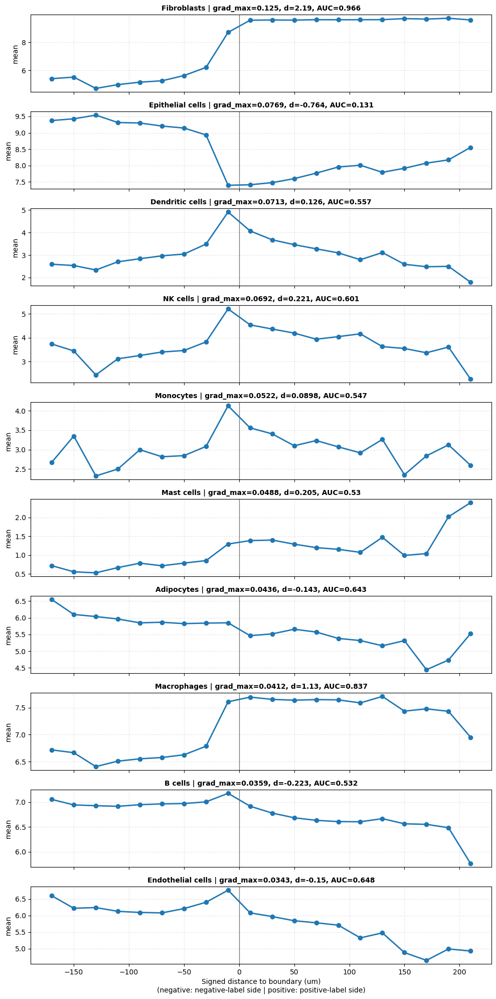

                   feature  contrast_d_pos_minus_neg  slope_near0_per_um  grad_max_abs_per_um  auc_sep_pos_vs_neg  n_total  n_neg_window  n_pos_window  n_slope_window
               Fibroblasts                  2.189813            0.052903             0.124665            0.966334    88160          8642          8481           82403
          Epithelial cells                 -0.763805           -0.022758             0.076881            0.130899    88160          8642          8481           82403
           Dendritic cells                  0.125721            0.008672             0.071253            0.556930    88160          8642          8481           82403
                  NK cells                  0.221189            0.011826             0.069155            0.600814    88160          8642          8481           82403
                 Monocytes                  0.089823            0.006667             0.052223            0.546975    88160          8642          8481           8240

In [37]:
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

# ============================================================
# Interface Strength / Sharpness metrics
# ============================================================
def compute_interface_metrics(
    signed_df: pd.DataFrame,
    features: list[str],
    dist_col: str = "signed_dist_um",
    # contrast windows (exclude near 0)
    neg_window=(-150.0, -30.0),
    pos_window=(30.0, 150.0),
    # slope window around 0
    slope_window=(-60.0, 60.0),
    # binned profile for max gradient
    dist_min_um=-300.0,
    dist_max_um=300.0,
    bin_width_um=20.0,
    min_n_per_bin=20,
    # plotting
    plot_profiles: bool = True,
    n_plot: int = 12,
    sort_by: str = "grad_max_abs_per_um",
):
    """
    Returns
      metrics_df: per-feature interface metrics
      profiles: dict[feature] -> (x_centers, y_means, n_per_bin)

    Metrics
      contrast_d_pos_minus_neg : Cohen's d between pos_window and neg_window (pos - neg)
      slope_near0_per_um       : linear slope of value vs distance near 0 (units per um)
      grad_max_abs_per_um      : max |dy/dx| along the binned profile (units per um)
      auc_sep_pos_vs_neg       : AUC separating pos vs neg (Mann-Whitney equivalence)
    """
    if dist_col not in signed_df.columns:
        raise ValueError(f"Missing `{dist_col}` in signed_df.")

    missing = [f for f in features if f not in signed_df.columns]
    if missing:
        raise ValueError(f"Missing feature columns in signed_df: {missing}")

    df0 = signed_df.copy()
    df0 = df0[np.isfinite(df0[dist_col].to_numpy(dtype=float))].copy()
    if df0.empty:
        raise ValueError("No finite distance rows.")

    edges = np.arange(dist_min_um, dist_max_um + bin_width_um, bin_width_um)
    centers = (edges[:-1] + edges[1:]) / 2.0

    def cohens_d(a, b):
        a = np.asarray(a, dtype=float)
        b = np.asarray(b, dtype=float)
        a = a[np.isfinite(a)]
        b = b[np.isfinite(b)]
        if len(a) < 2 or len(b) < 2:
            return np.nan
        va = a.var(ddof=1)
        vb = b.var(ddof=1)
        denom_df = len(a) + len(b) - 2
        if denom_df <= 0:
            return np.nan
        pooled = np.sqrt(((len(a) - 1) * va + (len(b) - 1) * vb) / denom_df)
        if not np.isfinite(pooled) or pooled == 0:
            return np.nan
        return float((a.mean() - b.mean()) / pooled)

    def auc_sep(scores, labels01):
        scores = np.asarray(scores, dtype=float)
        y = np.asarray(labels01, dtype=int)
        m = np.isfinite(scores) & np.isfinite(y)
        scores = scores[m]
        y = y[m]
        if len(scores) < 10 or len(np.unique(y)) < 2:
            return np.nan
        u, _ = stats.mannwhitneyu(scores[y == 1], scores[y == 0], alternative="two-sided")
        n1 = int((y == 1).sum())
        n0 = int((y == 0).sum())
        return float(u / (n1 * n0))

    metrics = []
    profiles = {}

    dist = df0[dist_col].to_numpy(dtype=float)

    for feat in features:
        y_raw = df0[feat].to_numpy(dtype=float)
        m = np.isfinite(y_raw)
        d = dist[m]
        y = y_raw[m]
        if len(y) < 30:
            continue

        # Contrast windows
        neg_mask = (d >= neg_window[0]) & (d <= neg_window[1])
        pos_mask = (d >= pos_window[0]) & (d <= pos_window[1])
        neg_vals = y[neg_mask]
        pos_vals = y[pos_mask]
        contrast = cohens_d(pos_vals, neg_vals)  # pos - neg

        # Slope near 0
        sw_mask = (d >= slope_window[0]) & (d <= slope_window[1])
        if int(sw_mask.sum()) >= 30:
            slope, intercept = np.polyfit(d[sw_mask], y[sw_mask], deg=1)
            slope0 = float(slope)
        else:
            slope0 = np.nan

        # Binned profile and max gradient
        bins = pd.cut(d, bins=edges, labels=centers, include_lowest=True)
        prof = (
            pd.DataFrame({"bin": bins, "val": y})
            .groupby("bin", observed=False)["val"]
            .mean()
            .dropna()
        )
        cnt = (
            pd.DataFrame({"bin": bins})
            .groupby("bin", observed=False)
            .size()
            .reindex(prof.index, fill_value=0)
            .astype(int)
        )

        if not prof.empty:
            valid = cnt[cnt >= min_n_per_bin].index
            prof = prof.reindex(valid).dropna()
            cnt = cnt.reindex(prof.index).astype(int)

        if prof.empty or len(prof) < 3:
            grad_max = np.nan
            profiles[feat] = (np.array([]), np.array([]), np.array([]))
        else:
            x = np.array([float(c) for c in prof.index.astype(float)])
            yb = prof.to_numpy(dtype=float)
            nb = cnt.to_numpy(dtype=int)

            order = np.argsort(x)
            x = x[order]
            yb = yb[order]
            nb = nb[order]

            g = np.diff(yb) / np.diff(x)
            grad_max = float(np.nanmax(np.abs(g))) if len(g) else np.nan
            profiles[feat] = (x, yb, nb)

        # AUC separability pos vs neg (exclude near 0)
        sep_mask = (d <= neg_window[1]) | (d >= pos_window[0])
        auc = auc_sep(y[sep_mask], (d[sep_mask] > 0).astype(int))

        metrics.append(
            {
                "feature": feat,
                "contrast_d_pos_minus_neg": contrast,
                "slope_near0_per_um": slope0,
                "grad_max_abs_per_um": grad_max,
                "auc_sep_pos_vs_neg": auc,
                "n_total": int(len(y)),
                "n_neg_window": int(len(neg_vals)),
                "n_pos_window": int(len(pos_vals)),
                "n_slope_window": int(sw_mask.sum()),
            }
        )

    metrics_df = pd.DataFrame(metrics)
    if metrics_df.empty:
        raise ValueError("No metrics computed (check feature columns / NaNs / thresholds).")

    if sort_by in metrics_df.columns:
        metrics_df = metrics_df.sort_values(sort_by, ascending=False).reset_index(drop=True)

    if plot_profiles:
        top_feats = metrics_df["feature"].head(int(n_plot)).tolist()
        n = len(top_feats)
        fig, axes = plt.subplots(nrows=n, ncols=1, figsize=(10, max(3, 2.0 * n)), sharex=True)
        if n == 1:
            axes = [axes]
        for ax, feat in zip(axes, top_feats):
            x, yb, nb = profiles.get(feat, (np.array([]), np.array([]), np.array([])))
            ax.axvline(0.0, color="black", lw=1, alpha=0.5)
            if len(x):
                ax.plot(x, yb, marker="o", lw=2)
                row = metrics_df.loc[metrics_df["feature"] == feat].iloc[0]
                ax.set_title(
                    f"{feat} | grad_max={row['grad_max_abs_per_um']:.3g}, "
                    f"d={row['contrast_d_pos_minus_neg']:.3g}, "
                    f"AUC={row['auc_sep_pos_vs_neg']:.3g}",
                    fontsize=10,
                    fontweight="bold",
                )
            else:
                ax.set_title(f"{feat} | (insufficient bins)", fontsize=10, fontweight="bold")
            ax.grid(True, ls="--", alpha=0.3)
            ax.set_ylabel("mean")
        axes[-1].set_xlabel(
            "Signed distance to boundary (um)\n(negative: negative-label side | positive: positive-label side)"
        )
        plt.tight_layout()
        plt.show()

    return metrics_df, profiles


# ============================================================
# Usage
# ============================================================
if "signed_base" not in globals():
    raise NameError("Missing `signed_base`. Run the signed-distance block first.")

# Exclude metadata and derived columns; keep numeric features.
x_col = "x_um" if "x_um" in signed_base.columns else "x_phys"
y_col = "y_um" if "y_um" in signed_base.columns else "y_phys"

exclude_cols = {
    x_col,
    y_col,
    "x_bin",
    "y_bin",
    "region",
    "dominant_marker_group",   # new name
    "dominant_type",           # legacy name (excluded for compatibility)
    "neighbor_count",
    "neighbor_density_per_um2",
    "neighbor_density_per_area",
    "heterogeneity_index_hard",
    "heter_hard",
    "heter_soft",
    "signed_dist_um",
    "is_boundary",
}

features = [
    c for c in signed_base.columns
    if c not in exclude_cols and pd.api.types.is_numeric_dtype(signed_base[c])
]
if not features:
    raise ValueError("No numeric features available for interface metrics.")

metrics_df, profiles = compute_interface_metrics(
    signed_df=signed_base,
    features=features,
    dist_col="signed_dist_um",
    neg_window=(-150.0, -30.0),
    pos_window=(30.0, 150.0),
    slope_window=(-60.0, 60.0),
    dist_min_um=-300.0,
    dist_max_um=300.0,
    bin_width_um=20.0,
    min_n_per_bin=20,
    plot_profiles=True,
    n_plot=10,
    sort_by="grad_max_abs_per_um",
)

print(metrics_df.head(30).to_string(index=False))

# Part 14: Targeted Spatial DGE of an Epithelial-Associated Gene Panel and EMT-Related Markers
# 第十四部分：上皮相关基因面板的靶向空间差异表达与 EMT 相关标记

## 1. Panel-Restricted Comparison to Reduce Background Effects
## 1. 通过面板限制降低背景影响
After defining the interface and observing boundary-adjacent changes in grid-level features, we next asked whether the two geometry-defined groups differ in the expression of epithelial-associated programs. Because the High Z-Var group contains strong non-epithelial signals in earlier analyses, we restricted the grid-by-gene matrix to a predefined gene panel derived from marker-group definitions (e.g., “Breast cancer”, “Breast glandular cells”, “Epithelial cells”). We then recomputed CPM using the panel-specific library size per grid. This within-panel normalization is intended to focus comparisons on relative expression patterns within the selected epithelial/tumor-associated gene set, while acknowledging that it does not remove all sources of compositional confounding.

在界面定义并观察到边界邻近区域的网格级特征变化之后，我们进一步提出一个问题：两类几何定义组在上皮相关转录程序上是否存在差异。由于前述分析显示高 Z-Var 组包含较强的非上皮信号，我们将网格×基因矩阵限制在由标记组定义得到的预设基因面板内（例如“Breast cancer”“Breast glandular cells”“Epithelial cells”），并基于该面板在每个网格内的计数重新计算 CPM。该“面板内归一化”旨在将比较聚焦于所选上皮/肿瘤相关基因集合内部的相对表达模式，但需要说明的是，这一处理并不能消除所有组成型混杂因素。

## 2. Low Z-Var Group: Higher Expression of Epithelial/Luminal-Associated Markers
## 2. 低 Z-Var 组：上皮/管腔相关标记相对更高
Within the panel-restricted DGE results, multiple epithelial-associated genes show higher mean panel-CPM in the Low Z-Var group. These include *CDH1* (E-cadherin) as well as luminal-associated transcription factors such as *FOXA1*, *GATA3*, and *AR* (examples). Under the current scoring and normalization scheme, these genes serve as candidate markers consistent with a more epithelial-associated transcriptional profile on the Low Z-Var side.

在面板限制的差异表达结果中，多种上皮相关基因在低 Z-Var 组显示更高的面板 CPM 均值。其中包括 *CDH1*（E-cadherin），以及与管腔相关的转录因子 *FOXA1*、*GATA3* 和 *AR*（示例）。在当前的计分与归一化方案下，这些基因可作为候选标记，与低 Z-Var 侧更偏上皮相关的转录特征相一致。

## 3. High Z-Var Group: Higher Expression of EMT-Associated and Invasion-Related Markers
## 3. 高 Z-Var 组：EMT 相关与侵袭相关标记相对更高
Conversely, the High Z-Var group shows higher mean panel-CPM for several genes that have been reported in EMT-associated or invasion-related contexts. Examples in this dataset include *ZEB1* (a transcriptional regulator linked to EMT), as well as *CXCL12*, *LRRC15*, and *SFRP1*. These differences support the hypothesis that the interface-adjacent, high Z-dispersion region is associated with altered epithelial transcriptional programs. However, the present analysis is based on grid-level aggregation and panel-restricted normalization; therefore, these results should be interpreted as spatially structured associations rather than as direct evidence of cell-intrinsic state transitions.

相反，高 Z-Var 组在若干与 EMT 相关或侵袭相关语境中被报道的基因上显示更高的面板 CPM 均值。在该数据集中，例子包括 *ZEB1*（与 EMT 相关的转录调控因子），以及 *CXCL12*、*LRRC15* 和 *SFRP1*。这些差异支持一个可检验的假设：界面邻近且 Z 离散度较高的区域可能伴随上皮相关转录程序的改变。但需要强调的是，本分析基于网格级聚合与面板内归一化，因此结果应主要解读为空间结构化的关联，而不宜直接推断为单细胞层面的细胞内在状态转变。

In [38]:
import warnings

import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Targeted DGE within a marker-defined epithelial/tumor-associated panel
# ---------------------------------------------------------------------------
# This block restricts the gene universe to predefined marker groups and
# recomputes CPM using the panel-specific library size per grid.

# -----------------------
# 0) Inputs and settings
# -----------------------
GROUP_A = "High_Z_Var_Group"
GROUP_B = "Low_Z_Var_Group"

PSEUDOCOUNT = 1.0          # used for log2FC on mean CPM
MIN_PANEL_COUNTS_PER_GRID = 5
MIN_MEAN_CPM_PER_GENE = 10.0
Q_THRESH = 0.05
LOG2FC_REPORT_THRESH = 0.5

# Marker groups used to define the panel
PANEL_GROUPS = ["Breast cancer", "Breast glandular cells", "Epithelial cells"]

if "grid_matrix" not in globals():
    raise NameError("Missing `grid_matrix`. Run Part 6 to build the grid-by-gene count matrix.")

# Expect dge_group to be present in the index (as constructed in Part 6).
idx_names = list(grid_matrix.index.names) if hasattr(grid_matrix.index, "names") else []
if "dge_group" not in idx_names:
    raise ValueError(
        "Expected `grid_matrix` index to include `dge_group`. "
        f"Found index names: {idx_names}"
    )

marker_df = pd.read_csv(MARKER_CSV).dropna(subset=["gene", "group"])

panel_genes = (
    marker_df.loc[marker_df["group"].isin(PANEL_GROUPS), "gene"]
    .dropna()
    .astype(str)
    .unique()
    .tolist()
)

# Keep only genes present in the expression matrix.
panel_genes = [g for g in panel_genes if g in grid_matrix.columns]
if not panel_genes:
    raise ValueError("No panel genes overlap with `grid_matrix` columns under the current settings.")

# -----------------------
# 1) Panel-specific CPM normalization
# -----------------------
panel_matrix = grid_matrix[panel_genes].copy()

panel_lib_size = panel_matrix.sum(axis=1)
valid_grids = panel_lib_size >= MIN_PANEL_COUNTS_PER_GRID

panel_matrix_valid = panel_matrix.loc[valid_grids]
panel_lib_size_valid = panel_lib_size.loc[valid_grids]

panel_cpm = panel_matrix_valid.div(panel_lib_size_valid, axis=0) * 1e6

group_idx = panel_cpm.index.get_level_values("dge_group")
a = panel_cpm.loc[group_idx == GROUP_A]
b = panel_cpm.loc[group_idx == GROUP_B]

print(f"Grid count -> {GROUP_A}: {len(a)}, {GROUP_B}: {len(b)}")

# -----------------------
# 2) Gene-wise testing (Mann-Whitney U) + BH-FDR
# -----------------------
rows = []
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for gene in panel_genes:
        x = a[gene].to_numpy(dtype=float)
        y = b[gene].to_numpy(dtype=float)

        mean_x = float(np.mean(x))
        mean_y = float(np.mean(y))

        # Skip very low-signal genes within this panel.
        if mean_x < MIN_MEAN_CPM_PER_GENE and mean_y < MIN_MEAN_CPM_PER_GENE:
            continue

        log2fc = float(np.log2((mean_x + PSEUDOCOUNT) / (mean_y + PSEUDOCOUNT)))

        if np.var(x) == 0.0 and np.var(y) == 0.0:
            p_val = 1.0
        else:
            _, p_val = stats.mannwhitneyu(x, y, alternative="two-sided")

        rows.append(
            {
                "Gene": gene,
                f"{GROUP_A}_CPM": mean_x,
                f"{GROUP_B}_CPM": mean_y,
                "log2FC": log2fc,
                "pval": float(p_val),
            }
        )

panel_dge = pd.DataFrame(rows).set_index("Gene")
_, qvals, _, _ = multipletests(panel_dge["pval"].fillna(1.0), method="fdr_bh")
panel_dge["qval"] = qvals

# -----------------------
# 3) Display helpers
# -----------------------
def fmt_q(q: float) -> str:
    if not np.isfinite(q):
        return "nan"
    if q == 0.0:
        # Underflow in floating-point representation.
        return "< 1e-300"
    return f"{q:.3e}"

sig = panel_dge.loc[panel_dge["qval"] < Q_THRESH].sort_values("log2FC", ascending=False).copy()
sig["qval_str"] = sig["qval"].map(fmt_q)

up = sig.loc[sig["log2FC"] > LOG2FC_REPORT_THRESH].copy()
down = sig.loc[sig["log2FC"] < -LOG2FC_REPORT_THRESH].copy()

print("\n=== Higher in group A (panel CPM) ===")
print(
    up[[ "log2FC", f"{GROUP_A}_CPM", f"{GROUP_B}_CPM", "qval_str" ]]
    .head(15)
    .to_string()
)

print("\n=== Lower in group A (panel CPM) ===")
print(
    down[[ "log2FC", f"{GROUP_A}_CPM", f"{GROUP_B}_CPM", "qval_str" ]]
    .head(15)
    .to_string()
)

# Keep for downstream enrichment/plots
panel_dge_results = panel_dge

Grid count -> High_Z_Var_Group: 44167, Low_Z_Var_Group: 44028

=== Higher in group A (panel CPM) ===
           log2FC  High_Z_Var_Group_CPM  Low_Z_Var_Group_CPM    qval_str
Gene                                                                    
MUC6     1.365091            134.631758            51.653614   2.326e-02
SFRP1    1.214159          18050.130833          7779.474776    < 1e-300
CXCL12   1.075547          73937.886965         35082.351964    < 1e-300
LRRC15   0.940338           5597.765000          2916.575968   3.642e-64
CLIC6    0.903482            543.861106           290.279911   6.416e-22
SDC4     0.792302           4326.487901          2497.787298    < 1e-300
KIT      0.782196           2415.650636          1404.236203   7.600e-08
ZEB1     0.777708          11461.972825          6685.269427  5.858e-133
OPRPN    0.757191            962.778826           569.217109   2.724e-06
LDHB     0.677014          18455.158955         11542.564245    < 1e-300
MYBPC1   0.655747      

# Part 15: Functional Enrichment of EMT-Associated and Invasion-Related Signatures (Exploratory)
# 第十五部分：EMT 相关与侵袭相关特征的功能富集（探索性）

## 1. Contextualizing Panel-Restricted Spatial Differences
## 1. 面板限制差异的功能语境化
Following the panel-restricted DGE analysis in Part 14, we performed an exploratory pathway enrichment analysis on the differentially expressed genes within the predefined epithelial/tumor-associated panel. The purpose of this step is to summarize functional themes associated with genes showing higher expression in the High Z-Var group versus those higher in the Low Z-Var group, under the selected thresholds. Because the enrichment is based on thresholded gene lists and a raw P-value display cutoff, the results are treated as hypothesis-generating summaries rather than definitive evidence of pathway activation or EMT occurrence.

在第十四部分的面板限制差异表达分析之后，我们基于预设的上皮/肿瘤相关基因面板，对差异基因集合进行了探索性的通路富集分析。本步骤的目的，是在所选阈值条件下，对高 Z-Var 组相对高表达基因与低 Z-Var 组相对高表达基因所对应的功能主题进行汇总。由于富集分析依赖阈值截断的基因列表，并在展示中使用 raw P 值筛选，因此结果在此处作为提出可检验假设的摘要，而不作为“通路被激活”或“发生 EMT”的决定性证据。

## 2. Up-Regulated Gene Set: Candidate Stress/Metabolic Signatures
## 2. 上调基因集：压力/代谢相关主题的候选信号
In this dataset, enrichment terms derived from the up-regulated gene set include pathways such as “HIF-1 signaling pathway” and “Central carbon metabolism in cancer.” These terms are compatible with hypoxia-related and metabolic programs that are frequently discussed in cancer biology. However, enrichment terms reflect overlap between the input gene list and curated gene sets; therefore, interpretation should focus on the underlying overlapping genes and should consider multiple-testing adjusted statistics. In particular, infection- or disease-labeled KEGG terms can occur due to shared gene modules and should not be interpreted as direct evidence of a specific clinical condition.

在该数据集中，由上调基因集合得到的富集词条包含 “HIF-1 信号通路” 与 “癌症中心碳代谢”等。这些词条与肿瘤研究中常讨论的缺氧相关与代谢相关程序相容。然而，富集结果反映的是输入基因集合与已注释基因集之间的重叠关系；因此解释时应重点回到具体的重叠基因，并同时考虑多重检验校正后的统计量。需要注意的是，部分以感染或疾病命名的 KEGG 词条也可能由于共享基因模块而出现，不应直接解读为特定临床状态的证据。

## 3. Interpretation and Scope
## 3. 解释范围与适用性
Together with the gene-level results from Part 14, the enrichment output provides a compact functional summary of candidate programs associated with the High Z-Var side under panel-restricted normalization. These observations support prioritizing a small set of pathways and genes for follow-up visualization along the signed-distance axis and for spatial mapping. At the same time, causal statements (e.g., EMT initiation at the interface or invasion-front tracking) require additional evidence beyond enrichment results, including spatial localization, consistency across parameter settings, and ideally independent validation.

结合第十四部分的基因层面结果，这些富集输出为在面板内归一化条件下与高 Z-Var 侧相关的候选转录程序提供了简要的功能概览。该结果可用于优先筛选少量通路与基因，以在后续步骤中沿有符号距离轴进一步可视化，并进行空间映射。与此同时，关于因果或机制性的表述（例如界面处发生 EMT、或由几何指标直接追踪侵袭前沿）需要超出富集分析的额外证据支撑，包括空间定位、一致的参数敏感性检验，以及在理想情况下的独立验证。

Pathway Enrichment Input Summary
DEG source table             : Panel-restricted DEG
Background genes (tested)    : 91
Up-regulated input genes     : 16
Down-regulated input genes   : 20
Input thresholds             : q < 0.05, |log2FC| > 0.5
Display cutoff (exploratory) : raw P < 0.05
-----------------------------------------------------------------
Running enrichment for up-regulated genes...
Running enrichment for down-regulated genes...
Enrichment complete.


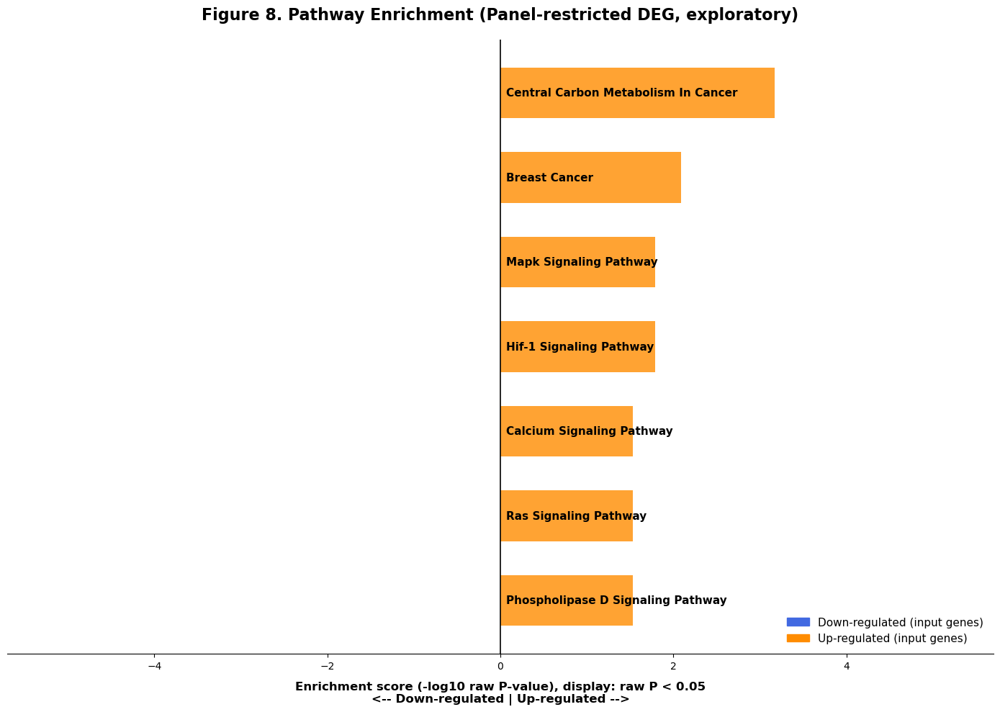

Top terms (Up-regulated):
                               Term  P-value  Adjusted P-value  Odds Ratio  Combined Score
Central carbon metabolism in cancer 0.000681          0.048347         inf             inf
                      Breast cancer 0.008080          0.286851   12.166667       58.622959
             MAPK signaling pathway 0.016395          0.291019   17.076923       70.198993
            HIF-1 signaling pathway 0.016395          0.291019   17.076923       70.198993
          Calcium signaling pathway 0.029304          0.297225         inf             inf
-----------------------------------------------------------------
Top terms (Down-regulated):
None found under current display cutoff.


In [39]:
import re
import gseapy as gp
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# ===========================================================================
# Part 15: Pathway Enrichment (Panel-restricted DEG; exploratory display)
# ===========================================================================

# ---------------------------------------------------------------------------
# 15.1 Input DEG table and thresholds
# ---------------------------------------------------------------------------
# Prefer the cleaned panel DGE results if present; fall back to legacy variable.
if "panel_dge_results" in globals():
    deg_tbl = panel_dge_results.copy()
    deg_label = "Panel-restricted DEG"
elif "tumor_dge" in globals():
    deg_tbl = tumor_dge.copy()
    deg_label = "Legacy DEG table"
else:
    raise NameError("Missing `panel_dge_results` (preferred) and `tumor_dge` (fallback).")

# Thresholds for defining input gene lists
FC_THRESH = 0.5
Q_THRESH = 0.05

# Display cutoff for enrichment terms (raw P-value; exploratory)
RAW_P_DISPLAY_CUTOFF = 0.05
TOP_N_TERMS = 15

sig = deg_tbl.loc[deg_tbl["qval"] < Q_THRESH].copy()
up_genes = sig.index[sig["log2FC"] > FC_THRESH].astype(str).tolist()
down_genes = sig.index[sig["log2FC"] < -FC_THRESH].astype(str).tolist()

background_genes = deg_tbl.index.astype(str).tolist()

print("=" * 65)
print("Pathway Enrichment Input Summary")
print("=" * 65)
print(f"DEG source table             : {deg_label}")
print(f"Background genes (tested)    : {len(background_genes)}")
print(f"Up-regulated input genes     : {len(up_genes)}")
print(f"Down-regulated input genes   : {len(down_genes)}")
print(f"Input thresholds             : q < {Q_THRESH}, |log2FC| > {FC_THRESH}")
print(f"Display cutoff (exploratory) : raw P < {RAW_P_DISPLAY_CUTOFF}")
print("-" * 65)

# ---------------------------------------------------------------------------
# 15.2 Enrichment (over-representation / hypergeometric test)
# ---------------------------------------------------------------------------
libraries = ["MSigDB_Hallmark_2020", "GO_Biological_Process_2023", "KEGG_2021_Human"]

enr_up = None
enr_down = None

try:
    if up_genes:
        print("Running enrichment for up-regulated genes...")
        enr_up = gp.enrich(
            gene_list=up_genes,
            gene_sets=libraries,
            background=background_genes,
            outdir=None,
        )
    else:
        print("Skip up-regulated enrichment: no input genes.")

    if down_genes:
        print("Running enrichment for down-regulated genes...")
        enr_down = gp.enrich(
            gene_list=down_genes,
            gene_sets=libraries,
            background=background_genes,
            outdir=None,
        )
    else:
        print("Skip down-regulated enrichment: no input genes.")

    print("Enrichment complete.")
except Exception as e:
    print(f"Error running gseapy enrichment: {e}")
    enr_up = None
    enr_down = None

# ---------------------------------------------------------------------------
# 15.3 Result processing (display-oriented)
# ---------------------------------------------------------------------------
def process_enrichment(enr_res, label, color, top_n=TOP_N_TERMS):
    if enr_res is None or getattr(enr_res, "results", None) is None or enr_res.results.empty:
        return pd.DataFrame()

    res = enr_res.results.copy()
    res = res.drop_duplicates(subset=["Term"]).copy()

    if "P-value" not in res.columns:
        return pd.DataFrame()

    res["P-value"] = pd.to_numeric(res["P-value"], errors="coerce")
    res = res.loc[res["P-value"].notna()].copy()
    res = res.loc[res["P-value"] < RAW_P_DISPLAY_CUTOFF].copy()
    if res.empty:
        return pd.DataFrame()

    res["score_rawp"] = -np.log10(res["P-value"] + 1e-10)
    res["group"] = label
    res["color"] = color
    return res.sort_values("score_rawp", ascending=False).head(top_n)

def format_enrichment_table(df, top_n=5):
    if df.empty:
        return "None found under current display cutoff."

    preferred_cols = ["Term", "P-value", "Adjusted P-value", "Overlap", "Odds Ratio", "Combined Score"]
    cols = [c for c in preferred_cols if c in df.columns]
    return df[cols].head(top_n).to_string(index=False) if cols else df.head(top_n).to_string(index=False)

df_up = process_enrichment(enr_up, "Up-regulated", "darkorange")
df_down = process_enrichment(enr_down, "Down-regulated", "royalblue")

if df_up.empty and df_down.empty:
    print("No enrichment terms passed the raw P-value display cutoff under current settings.")
else:
    # -----------------------------------------------------------------------
    # 15.4 Visualization: diverging bar chart (raw P-value score)
    # -----------------------------------------------------------------------
    plot_df = pd.concat([df_down, df_up], ignore_index=True)

    plot_df["plot_score"] = np.where(
        plot_df["group"] == "Down-regulated",
        -plot_df["score_rawp"],
        plot_df["score_rawp"],
    )
    plot_df = plot_df.sort_values("plot_score").reset_index(drop=True)

    fig, ax = plt.subplots(figsize=(14, 10))
    y = np.arange(len(plot_df))
    ax.barh(y, plot_df["plot_score"], color=plot_df["color"], alpha=0.8, height=0.6)
    ax.axvline(0, color="black", linewidth=1.2, zorder=3)

    max_abs = float(plot_df["score_rawp"].max())
    text_offset = max_abs * 0.02 if np.isfinite(max_abs) and max_abs > 0 else 0.1
    ax.set_xlim(-max_abs * 1.8, max_abs * 1.8)

    def clean_term(term: str) -> str:
        t = str(term)
        t = re.sub(r"\s*\(GO:\d+\)", "", t)
        t = re.sub(r"\s*Homo sapiens\s*hsa\d+", "", t)
        t = t.replace("HALLMARK_", "").replace("_", " ").title()
        return (t[:42] + "...") if len(t) > 45 else t

    for i, row in plot_df.iterrows():
        label = clean_term(row["Term"])
        if row["plot_score"] > 0:
            ax.text(text_offset, i, label, va="center", ha="left", fontsize=11, fontweight="bold", color="black")
        else:
            ax.text(-text_offset, i, label, va="center", ha="right", fontsize=11, fontweight="bold", color="black")

    ax.set_title(f"Figure 8. Pathway Enrichment ({deg_label}, exploratory)", fontsize=16, fontweight="bold", pad=20)
    ax.set_xlabel(
        f"Enrichment score (-log10 raw P-value), display: raw P < {RAW_P_DISPLAY_CUTOFF}\n"
        "<-- Down-regulated | Up-regulated -->",
        fontsize=12,
        fontweight="bold",
        labelpad=10,
    )

    ax.set_yticks([])
    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        handles=[
            mpatches.Patch(color="royalblue", label="Down-regulated (input genes)"),
            mpatches.Patch(color="darkorange", label="Up-regulated (input genes)"),
        ],
        loc="lower right",
        frameon=False,
        fontsize=11,
    )

    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------------
    # 15.5 Text summary
    # -----------------------------------------------------------------------
    print("=" * 65)
    print("Top terms (Up-regulated):")
    print(format_enrichment_table(df_up, top_n=5))
    print("-" * 65)
    print("Top terms (Down-regulated):")
    print(format_enrichment_table(df_down, top_n=5))
    print("=" * 65)

# Conclusion and Discussion
# 总结与讨论

This notebook presents a segmentation-free analysis workflow for a public Xenium FFPE breast cancer dataset. After transcript-level QC (34,472,294 transcripts retained in the current run), we summarized global Z-coordinate patterns and then shifted the analysis to grid-level features to reduce reliance on absolute Z depth. We defined the Z-Stacking Index as within-grid Z standard deviation and used it together with grid transcript count (log-transformed) to derive geometry-defined spatial domains, followed by grid-level DGE, marker-group scoring, neighborhood association analysis, and interface-centric signed-distance profiling.

本 Notebook 提供了一套无需细胞分割的 Xenium FFPE 乳腺癌公开数据分析流程。在转录本层面完成 QC（本次运行保留 34,472,294 条转录本）后，我们首先汇总了全局 Z 坐标模式，并将分析重心转向网格级特征，以降低对绝对 Z 深度的依赖。我们将 Z-Stacking Index 定义为网格内 Z 坐标的标准差，并与每网格转录本计数（对数变换）共同用于构建几何定义的空间区室；随后依次进行网格级差异表达、标记组得分、邻域关联分析以及基于有符号距离的界面轮廓分析。

Across 100,655 valid 20 × 20 µm grids, transcript count per grid and the Z-Stacking Index showed a near-zero Pearson correlation (r = 0.0086), indicating weak linear coupling between these two summaries under the current settings. Unsupervised clustering in this two-feature space enabled downstream comparisons between two major groups (excluding the low-density group). Grid-level DGE between High_Z_Var_Group and Low_Z_Var_Group identified 28 practical markers using thresholds |log2FC| ≥ 1.5, Mean CPM ≥ 100, and q < 0.001. The High_Z_Var_Group markers included genes commonly associated with adipose/lipid programs and immune effectors (e.g., ADIPOQ, LEP, GZMB, IL2RA), whereas the Low_Z_Var_Group markers included epithelial-associated and proliferation-associated genes (e.g., EPCAM, KRT7, KRT8, TOP2A).

在 100,655 个有效的 20 × 20 µm 网格上，每网格转录本计数与 Z-Stacking Index 的 Pearson 相关系数接近于零（r = 0.0086），提示在当前设置下两者在线性意义上耦合较弱。基于这两个特征的无监督聚类使得后续能够在两个主要组之间开展比较（并排除低密度组）。在 High_Z_Var_Group 与 Low_Z_Var_Group 之间的网格级 DGE 分析中，采用 |log2FC| ≥ 1.5、Mean CPM ≥ 100、q < 0.001 的阈值共得到 28 个 practical markers。High_Z_Var_Group 的标记基因包含多种与脂肪/脂质相关程序及免疫效应分子常相关的基因（如 ADIPOQ、LEP、GZMB、IL2RA），而 Low_Z_Var_Group 的标记基因则包含多种上皮相关与增殖相关基因（如 EPCAM、KRT7、KRT8、TOP2A）。

Marker-group scoring provided an additional, segmentation-free layer for interpreting these geometry-defined groups. In the current run, fibroblast-associated marker groups were higher in High_Z_Var_Group (Cohen’s d ≈ 1.23), while breast glandular and epithelial-associated marker groups were higher in Low_Z_Var_Group (e.g., breast glandular cells d ≈ −1.04). These score differences are grid-level summaries of predefined gene sets and are most appropriately interpreted as spatially structured expression patterns rather than direct estimates of cell-type proportions.

标记组得分为几何定义组的解释提供了额外的、分割无关的证据层。在本次运行中，成纤维细胞相关标记组在 High_Z_Var_Group 中更高（Cohen’s d ≈ 1.23），而乳腺腺体细胞与上皮相关标记组在 Low_Z_Var_Group 中更高（例如乳腺腺体细胞 d ≈ −1.04）。需要强调的是，这些得分是对预定义基因集的网格级汇总，更适宜解读为具有空间结构的表达模式，而非细胞类型比例的直接估计。

Neighborhood analysis indicated region-dependent associations between Z dispersion and local spatial context. Z-Stacking Index correlated positively with neighborhood density in Cluster 1 (ρ = 0.217) and negatively in Cluster 2 (ρ = −0.099). When controlling for log1p(transcript_count) via partial Spearman correlation, the density–Z association remained positive and relatively stable in Cluster 1 (~0.16–0.18 across radii 40–120 µm) but moved toward zero in Cluster 2 (~0.01 to slightly negative). Soft heterogeneity (Gini–Simpson based on aggregated marker-group scores) showed a stronger positive association with Z dispersion in Cluster 2, with partial correlations remaining positive and decreasing with radius (~0.28 to ~0.24). Together, these results support treating neighborhood density and neighborhood mixing as complementary, scale-dependent correlates of Z dispersion, while keeping interpretation at the level of statistical association.

邻域分析显示 Z 离散度与局部空间语境之间的关联在不同区域中方向不同。Z-Stacking Index 在 Cluster 1 中与邻域密度呈正相关（ρ = 0.217），在 Cluster 2 中呈负相关（ρ = −0.099）。在以 log1p(transcript_count) 作为协变量计算偏 Spearman 相关后，Cluster 1 中密度–Z 的偏相关仍为正且随半径变化较小（40–120 µm 半径下约 0.16–0.18），而 Cluster 2 中则趋近于零（约 0.01 到略为负值）。以邻域内标记组得分聚合定义的软异质性（Gini–Simpson）在 Cluster 2 中与 Z 离散度呈更强的正相关，且偏相关随半径增加而下降（约 0.28 至约 0.24）。综合来看，这些结果支持将邻域密度与邻域混合度视为 Z 离散度的互补、尺度依赖的统计相关因素，并将解释限定在关联层面。

To reduce the influence of non-epithelial signals on normalization, we performed a panel-restricted DGE analysis using a predefined epithelial/tumor-associated gene panel and panel-specific CPM normalization. Under this setup, High_Z_Var_Group showed higher panel-CPM for EMT-associated or invasion-related markers (e.g., ZEB1, CXCL12, LRRC15, SFRP1), whereas Low_Z_Var_Group showed higher panel-CPM for epithelial/luminal-associated markers (e.g., CDH1, FOXA1, GATA3, AR). Exploratory enrichment of the up-regulated gene set in this panel returned candidate pathway terms including HIF-1 signaling, MAPK signaling, and central carbon metabolism in cancer; these enrichment results depend on thresholded gene lists and should be treated as hypothesis-generating summaries rather than definitive pathway activation calls.

为降低非上皮信号对归一化的影响，我们基于预设的上皮/肿瘤相关基因面板进行了面板限制的 DGE 分析，并采用面板内 CPM 归一化。在该设置下，High_Z_Var_Group 在若干 EMT 相关或侵袭相关语境中常被报道的基因上显示更高的面板 CPM（如 ZEB1、CXCL12、LRRC15、SFRP1），而 Low_Z_Var_Group 在上皮/管腔相关标记上显示更高的面板 CPM（如 CDH1、FOXA1、GATA3、AR）。对该面板上调基因集合进行的探索性富集分析得到若干候选通路词条，包括 HIF-1 信号通路、MAPK 信号通路与癌症中心碳代谢等；由于富集分析依赖阈值截断的基因列表，这些结果应作为提出假设的汇总，而不作为通路被激活的决定性结论。

Limitations of the current analysis primarily stem from grid-level aggregation and parameter choices. Grids are not statistically independent due to spatial autocorrelation, and p-values can underflow to zero under large sample sizes; effect sizes and profile shapes should therefore be emphasized over raw significance. The Z-Stacking Index captures within-grid Z-coordinate dispersion, which can reflect biological structure but may also be influenced by acquisition geometry and optical sectioning. Several steps (GMM component count, grid size, boundary definition radius, bin width) are analysis settings that may affect quantitative values and should be assessed via sensitivity checks or replication in additional samples.

当前分析的主要局限来自网格级聚合与参数设置。由于空间自相关，网格之间并非统计独立；在样本量很大时，p 值也可能出现数值下溢为 0 的情况，因此解读时应更强调效应量与轮廓形状，而非仅依赖显著性。Z-Stacking Index 表征的是网格内 Z 坐标的离散程度，它可能反映生物学结构，但也可能受到采集几何与光学切面的影响。若干关键步骤（GMM 组分数、网格尺寸、边界定义半径、距离分箱宽度）均属于分析设置，可能影响定量结果，建议通过敏感性检查或在更多样本中复现。

In practical terms, the workflow provides a framework for integrating geometry-derived summaries with molecular readouts at single-molecule resolution, while avoiding dependence on cell segmentation. Natural next steps include (i) applying the same pipeline to additional Xenium datasets to evaluate reproducibility, (ii) comparing grid-based results with segmentation-based analyses as a sensitivity check, and (iii) incorporating spatially aware statistical models (e.g., spatial permutation or block bootstrap) to better account for spatial dependence.

在实践层面，该流程提供了一个框架：在不依赖细胞分割的前提下，将由坐标直接计算得到的几何摘要特征与分子层面的读出在单分子分辨率下进行整合。后续较自然的工作包括：（i）在更多 Xenium 数据集上复用同一流程以评估可重复性；（ii）将网格法结果与分割法结果进行对照作为敏感性检查；（iii）引入空间统计模型（如空间置换或分块自助法）以更合理地处理空间依赖性。